<a href="https://colab.research.google.com/github/JVR27XD/SAM/blob/main/Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 1. Montar Google Drive y definir rutas
from google.colab import drive
drive.mount('/content/drive')

RUTA_PROYECTO = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI"
LABELED_DIR = f"{RUTA_PROYECTO}/Labeled"
CHECKPOINTS_DIR = f"{RUTA_PROYECTO}/checkpoints"

import os
os.makedirs(CHECKPOINTS_DIR, exist_ok=True)


Mounted at /content/drive


In [ ]:
import os
os.makedirs("/content/drive/MyDrive/Colab Notebooks/SolDef_AI", exist_ok=True)


In [ ]:
# 📦 2. Clonar Segment Anything Model (SAM)
!git clone https://github.com/facebookresearch/segment-anything.git
%cd segment-anything

Cloning into 'segment-anything'...
remote: Enumerating objects: 304, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 304 (delta 2), reused 1 (delta 1), pack-reused 299 (from 2)
Receiving objects: 100% (304/304), 18.31 MiB | 20.03 MiB/s, done.
Resolving deltas: 100% (159/159), done.
/content/segment-anything


Este bloque se encarga de preparar la carpeta donde se almacenarán los pesos preentrenados del modelo SAM.
Si el archivo ya está disponible en el directorio, lo reutiliza para ahorrar tiempo y recursos; si no, lo descarga automáticamente desde el repositorio oficial de Meta.

In [ ]:
import os

CHECKPOINTS_DIR = "/content/checkpoints"
os.makedirs(CHECKPOINTS_DIR, exist_ok=True)

checkpoint_path = f"{CHECKPOINTS_DIR}/sam_vit_b.pth"

if not os.path.exists(checkpoint_path):
    !wget -O "$checkpoint_path" https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
else:
    print(f"✅ Checkpoint ya existe en: {checkpoint_path}")


--2025-08-21 10:43:54--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.65.3.109, 18.65.3.5, 18.65.3.36, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.65.3.109|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘/content/checkpoints/sam_vit_b.pth’

/content/checkpoint 100%[===================>] 357.67M   390MB/s    in 0.9s    

2025-08-21 10:43:55 (390 MB/s) - ‘/content/checkpoints/sam_vit_b.pth’ saved [375042383/375042383]



# Carga y preparación del modelo SAM (ViT-B) para entrenamiento

Este bloque inicializa el modeloen su variante ViT-B utilizando los pesos previamente descargados. Además, configura el dispositivo de ejecución (CPU o GPU según disponibilidad) y coloca el modelo en modo entrenamiento, lo que permite realizar fine-tuning.

In [ ]:
# Cargar modelo SAM
import torch
from segment_anything import sam_model_registry

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
sam = sam_model_registry['vit_b'](checkpoint=checkpoint_path)

sam.to(device=DEVICE)
sam.train()



Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d()
    )


# Generación de máscaras binarias a partir de anotaciones JSON
Esta función convierte anotaciones vectoriales en formato JSON a máscaras binarias de tamaño fijo ($1024\times1024$). Se lee el archivo de anotaciones, se calculan los factores de escala entre la resolución original y la deseada, y se dibujan los polígonos correspondientes sobre una imagen en escala de grises. El resultado es una máscara binaria en la que los píxeles pertenecientes a la región anotada se representan con valor 1, y el fondo con valor 0. Este preprocesado permite estandarizar las entradas de entrenamiento para el ajuste fino del modelo.



In [ ]:
# Función para generar máscaras desde JSON
import json
import numpy as np
from PIL import Image, ImageDraw

def mask_from_json(json_path, original_size, target_size=(1024, 1024)):

    with open(json_path) as f:
        data = json.load(f)

    # Escala entre imagen original y máscara final
    scale_x = target_size[0] / original_size[0]
    scale_y = target_size[1] / original_size[1]

    mask = Image.new("L", target_size, 0)
    draw = ImageDraw.Draw(mask)

    for shape in data.get("shapes", []):
        if shape["shape_type"] == "polygon":
            scaled_polygon = [
                (x * scale_x, y * scale_y) for x, y in shape["points"]
            ]
            draw.polygon(scaled_polygon, outline=1, fill=1)

    return mask



# Definición del conjunto de datos
A partir de los directorios que contienen imágenes en formato .jpg y sus anotaciones en .JSON, filtra únicamente aquellas muestras con anotación disponible. En cada acceso, carga la imagen RGB y genera la máscara binaria correspondiente dibujando los polígonos anotados mediante OpenCV. Tanto la imagen como la máscara se transforman en tensores.

In [ ]:
import os
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
import cv2
import glob

import torchvision.transforms.functional as TF

class PCBDefectDatasetFixed(Dataset):
    def __init__(self, img_dir, json_dir, size=(1024,1024)):
        self.img_paths = glob.glob(os.path.join(img_dir, "**", "*.jpg"), recursive=True)
        self.img_paths = [p for p in self.img_paths
                          if os.path.exists(os.path.join(json_dir, os.path.basename(p).replace(".jpg",".json")))]
        self.json_dir = json_dir
        self.size = size

    def __len__(self): return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        filename = os.path.basename(img_path)
        image = Image.open(img_path).convert("RGB")
        W,H = image.size

        # máscara original
        mask = np.zeros((H,W), dtype=np.uint8)
        with open(os.path.join(self.json_dir, filename.replace(".jpg",".json")), "r") as f:
            data = json.load(f)
            for s in data.get("shapes", []):
                if s["shape_type"]=="polygon":
                    pts = np.array(s["points"], dtype=np.int32)
                    cv2.fillPoly(mask, [pts], color=1)

        # Resize acoplado
        image = TF.resize(image, self.size, interpolation=TF.InterpolationMode.BILINEAR)
        mask  = Image.fromarray((mask*255).astype(np.uint8))
        mask  = TF.resize(mask, self.size, interpolation=TF.InterpolationMode.NEAREST)
        mask  = (np.array(mask)>127).astype(np.float32)

        image = ToTensor()(image)           # [0,1]
        mask  = torch.tensor(mask).unsqueeze(0)  # (1,H,W)
        return image, mask





In [ ]:
IMG_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Dataset"
JSON_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled"

dataset = PCBDefectDatasetFixed(IMG_DIR, JSON_DIR)
print(f"Total ejemplos: {len(dataset)}")

img, mask = dataset[0]
print("Image shape:", img.shape)   # -> torch.Size([3, H, W])
print("Mask shape:", mask.shape)   # -> torch.Size([1, H, W])



Total ejemplos: 428
Image shape: torch.Size([3, 1024, 1024])
Mask shape: torch.Size([1, 1024, 1024])


# Visualización de ejemplo

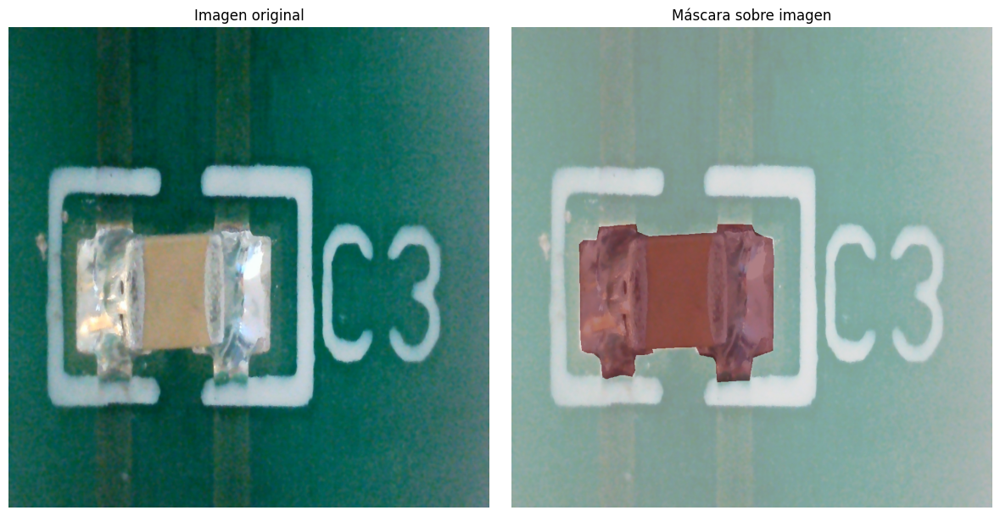

In [ ]:
import matplotlib.pyplot as plt

def mostrar_ejemplo(dataset, idx=0):
    img, mask = dataset[idx]

    # Convertir imagen y máscara a numpy
    img_np = img.permute(1, 2, 0).numpy()
    mask_np = mask.squeeze().numpy()

    plt.figure(figsize=(12, 6))

    # Imagen original
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.title("Imagen original")
    plt.axis("off")

    # Imagen con máscara superpuesta
    plt.subplot(1, 2, 2)
    plt.imshow(img_np)
    plt.imshow(mask_np, alpha=0.5, cmap='Reds')
    plt.title("Máscara sobre imagen")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# Visualizar uno
mostrar_ejemplo(dataset, idx=0)



# Bucle de entrenamiento del decodificador de máscaras (fine‑tuning parcial de SAM)


Este bloque define y ejecuta el entrenamiento ajustando solo el decodificador de máscaras de SAM. Primero congela todos los parámetros del modelo y habilita el gradiente únicamente en el decodificador; configura Adam (lr=1×10⁻⁴) y la pérdida BCE. Para cada imagen del batch genera un prompt positivo a partir del centroide de la máscara real, redimensiona la imagen a 1024×1024, obtiene la embedding del encoder sin gradiente y pasa los prompts por el prompt encoder y el decodificador. La salida se activa con sigmoide, se reescala al tamaño de la máscara y se calcula la pérdida para retropropagar solo sobre el decodificador. Al final de cada época calcula métricas (IoU, Dice, precisión y recall) sobre la última predicción, visualiza un ejemplo, guarda el checkpoint del decodificador y registra las métricas en CSV; las funciones auxiliares muestran predicciones y grafican la evolución de las métricas.



In [ ]:
import os, time, math, json
from datetime import timedelta
import torch
import pandas as pd
from torch.nn.functional import interpolate
from typing import Optional, Callable
import matplotlib.pyplot as plt

def _fmt_eta(seconds: float) -> str:
    return str(timedelta(seconds=int(max(0, seconds))))

def train_sam_decoder(
    sam,
    train_loader,
    epochs: int = 20,
    lr: float = 1e-4,
    device: str = "cuda",
    save_dir: str = "/content/drive/MyDrive/TFG",
    val_loader: Optional[torch.utils.data.DataLoader] = None,
    eval_fn: Optional[Callable] = None,   # debe devolver dict con keys: IoU, Dice, Prec, Rec
    best_by: str = "dice",                # "dice" o "iou"
    save_every: int = 1,
    use_amp: bool = True,
    grad_clip: Optional[float] = 1.0,
    plot_end: bool = True,                # <-- NUEVO: mostrar/guardar gráficas al final
):
    assert hasattr(sam, "mask_decoder"), "El modelo SAM no tiene 'mask_decoder'."
    assert isinstance(epochs, int) and epochs > 0
    assert isinstance(lr, float) and lr > 0
    assert len(train_loader) > 0, "train_loader está vacío."
    os.makedirs(save_dir, exist_ok=True)

    # Congelar todo salvo decoder
    for p in sam.parameters(): p.requires_grad = False
    for p in sam.mask_decoder.parameters(): p.requires_grad = True
    assert any(p.requires_grad for p in sam.mask_decoder.parameters())
    assert not any(p.requires_grad for n,p in sam.named_parameters() if "mask_decoder" not in n)

    sam.to(device)
    sam.train()

    optimizer = torch.optim.Adam(sam.mask_decoder.parameters(), lr=lr)
    criterion = torch.nn.BCEWithLogitsLoss()

    scaler = torch.amp.GradScaler("cuda", enabled=(use_amp and device.startswith("cuda")))
    metrics_log, best_metric, best_path = [], -math.inf, None

    total_batches = epochs * len(train_loader)
    global_start = time.time()

    print("==> Entrenando decoder de SAM")
    for epoch in range(epochs):
        epoch_start = time.time()
        total_loss = 0.0
        num_updates = 0
        ultima_image = ultima_gt = ultima_pred = None
        did_sanity_check = False

        for i, (images, masks_gt) in enumerate(train_loader):
            images = images.to(device, non_blocking=True)
            masks_gt = masks_gt.to(device, non_blocking=True)

            B, C, H, W = images.shape
            assert B >= 1 and C == 3, f"Imagen con shape inesperado: {images.shape}"
            assert masks_gt.shape == (B, 1, H, W), f"Máscara no alinea: {masks_gt.shape} vs {(B,1,H,W)}"

            if not did_sanity_check:
                min_im, max_im = images.min().item(), images.max().item()
                assert min_im >= -1e-3 and max_im <= 1.0 + 1e-3, f"Rango imagen [{min_im:.3f},{max_im:.3f}]"
                uniq = torch.unique(masks_gt)
                assert torch.all((uniq <= 1.0+1e-6) & (uniq >= -1e-6)), f"Máscara fuera de [0,1], valores: {uniq}"
                did_sanity_check = True

            for b in range(B):
                image = images[b].unsqueeze(0)   # (1,3,H,W)
                mask_gt = masks_gt[b]            # (1,H,W)

                coords = torch.nonzero(mask_gt[0] > 0.5, as_tuple=False)
                if len(coords) == 0:
                    continue

                # Centroide (y,x) en resolución original
                point = coords.float().mean(dim=0)   # (2,)
                assert 0 <= point[0] < H and 0 <= point[1] < W

                with torch.amp.autocast("cuda", enabled=(use_amp and device.startswith("cuda"))):
                    # Resize imagen a 1024 antes del encoder
                    image_resized = interpolate(image, size=(1024,1024), mode="bilinear", align_corners=False)

                    # Escalar el punto a 1024×1024
                    scale_y = 1024.0 / H
                    scale_x = 1024.0 / W
                    point_resized = torch.stack([point[0]*scale_y, point[1]*scale_x])  # (y',x')
                    point_coords = point_resized.unsqueeze(0).unsqueeze(0).to(dtype=torch.float32, device=device)  # (1,1,2)
                    point_labels = torch.tensor([[1]], dtype=torch.int, device=device)

                    with torch.no_grad():
                        image_embedding = sam.image_encoder(image_resized)

                    sparse_embeddings, dense_embeddings = sam.prompt_encoder(
                        points=(point_coords, point_labels), boxes=None, masks=None
                    )

                    low_res_logits, _ = sam.mask_decoder(
                        image_embeddings=image_embedding,
                        image_pe=sam.prompt_encoder.get_dense_pe(),
                        sparse_prompt_embeddings=sparse_embeddings,
                        dense_prompt_embeddings=dense_embeddings,
                        multimask_output=False,
                    )

                    logits_up = interpolate(low_res_logits, size=mask_gt.shape[-2:], mode="bilinear", align_corners=False)
                    loss = criterion(logits_up, mask_gt.unsqueeze(0))

                if not torch.isfinite(loss):
                    raise RuntimeError(f"Loss no finita en epoch {epoch+1}, batch {i}, sample {b}: {loss.item()}")

                optimizer.zero_grad(set_to_none=True)
                if scaler.is_enabled():
                    scaler.scale(loss).backward()
                    if grad_clip is not None:
                        scaler.unscale_(optimizer)
                        torch.nn.utils.clip_grad_norm_(sam.mask_decoder.parameters(), grad_clip)
                    scaler.step(optimizer)
                    scaler.update()
                else:
                    loss.backward()
                    if grad_clip is not None:
                        torch.nn.utils.clip_grad_norm_(sam.mask_decoder.parameters(), grad_clip)
                    optimizer.step()

                total_loss += loss.item()
                num_updates += 1

                with torch.no_grad():
                    prob = torch.sigmoid(logits_up)
                ultima_image = image[0].permute(1,2,0).detach().cpu().numpy()
                ultima_gt    = mask_gt[0].detach().cpu().numpy()
                ultima_pred  = prob[0,0].detach().cpu().numpy()

            # ETA por batch
            elapsed_epoch = time.time() - epoch_start
            batches_done  = epoch * len(train_loader) + (i + 1)
            batches_left  = total_batches - batches_done
            mean_batch_s  = (time.time() - global_start) / max(1, batches_done)
            eta_total     = mean_batch_s * batches_left
            eta_epoch     = (elapsed_epoch / (i + 1)) * (len(train_loader) - (i + 1))

            if i % 10 == 0:
                last_loss = float(loss.item()) if 'loss' in locals() else float('nan')
                print(f"[Epoch {epoch+1}/{epochs}] [Batch {i+1}/{len(train_loader)}] "
                      f"Loss: {last_loss:.4f} | ETA(época): {_fmt_eta(eta_epoch)} | ETA(total): {_fmt_eta(eta_total)}")

        # ---- Métricas rápidas de train (última muestra)
        avg_loss = total_loss / max(1, num_updates)
        pred_bin = (torch.tensor(ultima_pred) > 0.5).float()
        gt_bin   = (torch.tensor(ultima_gt)   > 0.5).float()
        inter    = (pred_bin * gt_bin).sum().item()
        union    = (pred_bin + gt_bin).clamp(0,1).sum().item()
        ps, gs   = pred_bin.sum().item(), gt_bin.sum().item()
        iou_tr   = inter / (union + 1e-7)
        dice_tr  = 2 * inter / (ps + gs + 1e-7)
        prec_tr  = inter / (ps + 1e-7)
        rec_tr   = inter / (gs + 1e-7)

        row = {"epoch": epoch+1, "loss": avg_loss,
               "train_iou_last": iou_tr, "train_dice_last": dice_tr,
               "train_prec_last": prec_tr, "train_rec_last": rec_tr}

        # ---- Validación (si se proporciona)
        ref_value = dice_tr if best_by.lower()=="dice" else iou_tr
        if val_loader is not None and eval_fn is not None:
            sam.eval()
            with torch.no_grad():
                val_metrics = eval_fn(sam, val_loader, device=device, label=f"fine-tuned @ epoch {epoch+1}")
            sam.train()

            row.update({"val_iou": val_metrics["IoU"], "val_dice": val_metrics["Dice"],
                        "val_prec": val_metrics["Prec"], "val_rec": val_metrics["Rec"]})

            ref_value = val_metrics["Dice"] if best_by.lower()=="dice" else val_metrics["IoU"]

        # ---- Print por epoch
        msg = (f"✅ Epoch {epoch+1}/{epochs} | Loss:{avg_loss:.4f} | "
               f"Train IoU:{iou_tr:.4f} Dice:{dice_tr:.4f} Prec:{prec_tr:.4f} Rec:{rec_tr:.4f}")
        if "val_iou" in row:
            msg += (f" || VAL IoU:{row['val_iou']:.4f} Dice:{row['val_dice']:.4f} "
                    f"Prec:{row['val_prec']:.4f} Rec:{row['val_rec']:.4f}")
        print(msg)

        # ---- Guardar mejor checkpoint según ref_value
        if ref_value > best_metric:
            best_metric = ref_value
            best_path = os.path.join(save_dir, f"sam_decoder_best_{best_by}.pth")
            torch.save(sam.mask_decoder.state_dict(), best_path)
            print(f"🏅 Nuevo mejor checkpoint ({best_by}={best_metric:.4f}) guardado en: {best_path}")

        metrics_log.append(row)

        # ---- Guardado periódico
        if ((epoch + 1) % max(1, save_every)) == 0:
            path = os.path.join(save_dir, f"sam_decoder_epoch{epoch+1}.pth")
            torch.save(sam.mask_decoder.state_dict(), path)
            print(f"💾 Decoder guardado: {path}")

    # ---- Guardar CSV
    df = pd.DataFrame(metrics_log)
    csv_path = os.path.join(save_dir, "sam_decoder_metrics.csv")
    df.to_csv(csv_path, index=False)
    print(f"📁 Métricas guardadas en '{csv_path}'")
    if best_path:
        print(f"🏁 Mejor checkpoint: {best_path}")

    # ---- Gráficas al final
    if plot_end:
        def plot_metric(ax, df, train_col, val_col=None, title="", ylim=None):
            ax.plot(df["epoch"], df[train_col], marker="o", label="train")
            if val_col is not None and val_col in df.columns:
                ax.plot(df["epoch"], df[val_col], marker="o", linestyle="--", label="val")
            ax.set_title(title); ax.set_xlabel("Epoch")
            if ylim is not None: ax.set_ylim(*ylim)
            ax.grid(True, alpha=0.3); ax.legend()

        fig, axes = plt.subplots(2, 3, figsize=(12, 8))

        # 1) Loss (si añadieras val_loss, lo pinta)
        plot_metric(axes[0,0], df, "loss", val_col="val_loss" if "val_loss" in df.columns else None, title="Loss")

        # 2) IoU
        plot_metric(axes[0,1], df, "train_iou_last", val_col="val_iou" if "val_iou" in df.columns else None,
                    title="IoU", ylim=(0,1.05))

        # 3) Dice
        plot_metric(axes[0,2], df, "train_dice_last", val_col="val_dice" if "val_dice" in df.columns else None,
                    title="Dice", ylim=(0,1.05))

        # 4) Precision
        plot_metric(axes[1,0], df, "train_prec_last", val_col="val_prec" if "val_prec" in df.columns else None,
                    title="Precision", ylim=(0,1.05))

        # 5) Recall
        plot_metric(axes[1,1], df, "train_rec_last", val_col="val_rec" if "val_rec" in df.columns else None,
                    title="Recall", ylim=(0,1.05))

        axes[1,2].axis("off")
        plt.tight_layout()
        fig_path = os.path.join(save_dir, "sam_decoder_training_curves.png")
        plt.savefig(fig_path, dpi=150)
        plt.show()
        print(f"🖼️ Curvas guardadas en: {fig_path}")

    return df





In [ ]:
from torch.utils.data import DataLoader, random_split

IMG_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Dataset"
JSON_DIR = "/content/drive/MyDrive/Colab Notebooks/SolDef_AI/Labeled"

# dataset personalizado
dataset_fixed = PCBDefectDatasetFixed(IMG_DIR, JSON_DIR, size=(1024,1024))

# dividir train/val (80/20)
N = len(dataset_fixed)
val_ratio = 0.2
n_val   = int(round(N * val_ratio))
n_train = N - n_val

train_dataset, val_dataset = random_split(dataset_fixed, [n_train, n_val], generator=torch.Generator().manual_seed(42))

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

print(f"Total: {N} | Train: {len(train_dataset)} | Val: {len(val_dataset)}")


Total: 428 | Train: 342 | Val: 86


In [ ]:
def evaluate_sam_pretrained(sam, loader, device="cuda", label="val"):
    sam.eval()
    inter = union = ps = gs = 0
    total_loss, n_samples = 0.0, 0
    criterion = torch.nn.BCEWithLogitsLoss()

    with torch.no_grad():
        for images, masks_gt in loader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            B, C, H, W = images.shape
            for b in range(B):
                image = images[b].unsqueeze(0)   # (1,3,H,W)
                mask_gt = masks_gt[b]            # (1,H,W)

                coords = torch.nonzero(mask_gt[0] > 0.5, as_tuple=False)
                if len(coords) == 0:
                    continue

                # Centroide (y,x)
                point = coords.float().mean(dim=0)

                # Resize imagen a 1024
                image_resized = interpolate(image, size=(1024,1024),
                                            mode="bilinear", align_corners=False)

                # Escalar punto
                scale_y = 1024.0 / H
                scale_x = 1024.0 / W
                point_resized = torch.stack([point[0]*scale_y, point[1]*scale_x])
                point_coords = point_resized.unsqueeze(0).unsqueeze(0).to(dtype=torch.float32, device=device)
                point_labels = torch.tensor([[1]], dtype=torch.int, device=device)

                # Forward SAM
                image_embedding = sam.image_encoder(image_resized)
                sparse_embeddings, dense_embeddings = sam.prompt_encoder(
                    points=(point_coords, point_labels), boxes=None, masks=None
                )
                low_res_logits, _ = sam.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                logits_up = interpolate(low_res_logits, size=mask_gt.shape[-2:],
                                        mode="bilinear", align_corners=False)

                # ---- Loss (opcional, para registrar val_loss)
                loss = criterion(logits_up, mask_gt.unsqueeze(0))
                total_loss += loss.item()
                n_samples += 1

                # ---- Métricas
                prob = torch.sigmoid(logits_up)
                pred_bin = (prob > 0.5).float()
                gt_bin   = (mask_gt > 0.5).float()

                inter += (pred_bin * gt_bin).sum().item()
                union += (pred_bin + gt_bin).clamp(0,1).sum().item()
                ps    += pred_bin.sum().item()
                gs    += gt_bin.sum().item()

    iou  = inter / (union + 1e-7)
    dice = 2 * inter / (ps + gs + 1e-7)
    prec = inter / (ps + 1e-7)
    rec  = inter / (gs + 1e-7)
    val_loss = total_loss / max(1, n_samples)

    return {"IoU": iou, "Dice": dice, "Prec": prec, "Rec": rec, "Loss": val_loss}



==> Entrenando decoder de SAM
[Epoch 1/20] [Batch 1/86] Loss: 0.0062 | ETA(época): 0:01:39 | ETA(total): 0:33:38
[Epoch 1/20] [Batch 11/86] Loss: 0.0089 | ETA(época): 0:00:53 | ETA(total): 0:20:11
[Epoch 1/20] [Batch 21/86] Loss: 0.0108 | ETA(época): 0:00:44 | ETA(total): 0:19:28
[Epoch 1/20] [Batch 31/86] Loss: 0.0112 | ETA(época): 0:00:37 | ETA(total): 0:19:05
[Epoch 1/20] [Batch 41/86] Loss: 0.0044 | ETA(época): 0:00:30 | ETA(total): 0:18:53
[Epoch 1/20] [Batch 51/86] Loss: 0.0131 | ETA(época): 0:00:23 | ETA(total): 0:18:43
[Epoch 1/20] [Batch 61/86] Loss: 0.0086 | ETA(época): 0:00:16 | ETA(total): 0:18:33
[Epoch 1/20] [Batch 71/86] Loss: 0.0065 | ETA(época): 0:00:10 | ETA(total): 0:18:24
[Epoch 1/20] [Batch 81/86] Loss: 0.0079 | ETA(época): 0:00:03 | ETA(total): 0:18:15
✅ Epoch 1/20 | Loss:0.0102 | Train IoU:0.9265 Dice:0.9618 Prec:0.9948 Rec:0.9310 || VAL IoU:0.9230 Dice:0.9600 Prec:0.9500 Rec:0.9702
🏅 Nuevo mejor checkpoint (dice=0.9600) guardado en: /content/drive/MyDrive/TFG/ch

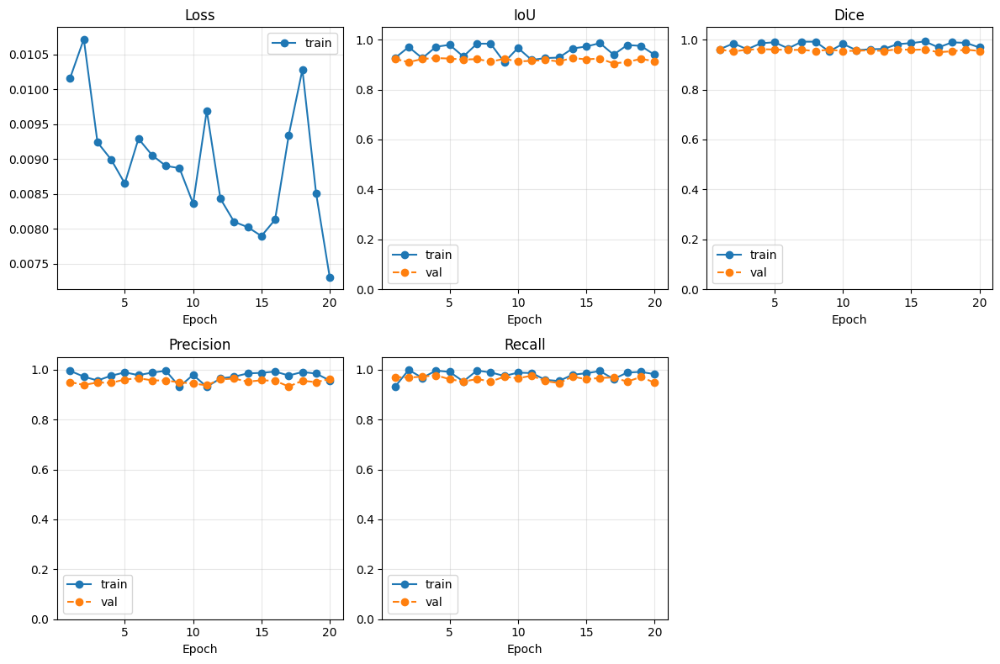

🖼️ Curvas guardadas en: /content/drive/MyDrive/TFG/checkpoints/sam_decoder_training_curves.png


In [ ]:
df_metrics = train_sam_decoder(
    sam,
    train_loader,
    epochs=20,
    lr=1e-4,
    device="cuda",
    save_dir="/content/drive/MyDrive/TFG/checkpoints",
    val_loader=val_loader,
    eval_fn=evaluate_sam_pretrained,   # ✅ ahora sí
    best_by="dice",
    save_every=5,
    use_amp=True,
    grad_clip=1.0,
)


In [ ]:
from torch.utils.data import random_split, DataLoader
import torch

n = len(dataset)
n_train = int(0.8 * n)
n_val   = n - n_train
train_dataset, val_dataset = random_split(dataset, [n_train, n_val], generator=torch.Generator().manual_seed(42))

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader   = DataLoader(val_dataset,   batch_size=1, shuffle=False)


In [ ]:
import torch, numpy as np
from tqdm import tqdm
from segment_anything import SamPredictor
from torch.nn.functional import interpolate

def evaluate_sam_pretrained(sam, dataloader, device="cuda", imagenet_norm=False, thr=0.5):
    """
    Evalúa SAM sin fine-tuning usando un point prompt en el centroide de la GT.
    - imagenet_norm: ponlo en True si tus imágenes vienen normalizadas (mean/std ImageNet).
    - thr: umbral para binarizar la predicción.
    """
    sam.eval().to(device)
    predictor = SamPredictor(sam)

    # Para desnormalizar si hace falta
    mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)

    iou_list, dice_list, precision_list, recall_list = [], [], [], []

    with torch.no_grad():
        for images, masks_gt in tqdm(dataloader, desc="Evaluando SAM preentrenado"):
            images = images.to(device, non_blocking=True)
            masks_gt = masks_gt.to(device, non_blocking=True)

            # Desnormalizar si procede
            if imagenet_norm:
                images_rgb01 = (images * std + mean).clamp(0, 1)
            else:
                images_rgb01 = images.clamp(0, 1)

            B, _, H, W = images.shape
            for b in range(B):
                gt = masks_gt[b]  # (1,H,W)

                # Puntos positivos (centroide)
                coords = torch.nonzero(gt[0] > 0.5, as_tuple=False)
                if coords.numel() == 0:
                    continue
                cy, cx = coords.float().mean(dim=0)  # (y,x)

                # Imagen RGB uint8 HWC
                img_np = (images_rgb01[b].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)

                # Predictor
                predictor.set_image(img_np)  # RGB
                point_coords = np.array([[cx.item(), cy.item()]], dtype=np.float32)  # (x,y)
                point_labels = np.array([1], dtype=np.int32)

                masks_pred, _, _ = predictor.predict(
                    point_coords=point_coords, point_labels=point_labels, multimask_output=False
                )

                pred = torch.from_numpy(masks_pred[0]).to(device).float().unsqueeze(0).unsqueeze(0)  # (1,1,h,w)
                gt_bin = (gt.unsqueeze(0) > 0.5).float()  # (1,1,H,W)

                if pred.shape[-2:] != gt_bin.shape[-2:]:
                    gt_bin = interpolate(gt_bin, size=pred.shape[-2:], mode="nearest")

                pred_bin = (pred > thr).float()

                inter = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0,1).sum().item()
                ps = pred_bin.sum().item()
                gs = gt_bin.sum().item()

                iou  = inter / (union + 1e-7)
                dice = 2 * inter / (ps + gs + 1e-7)
                prec = inter / (ps + 1e-7)
                rec  = inter / (gs + 1e-7)

                iou_list.append(iou); dice_list.append(dice)
                precision_list.append(prec); recall_list.append(rec)

    if not iou_list:
        print("⚠️ No se evaluaron muestras válidas (todas sin máscara positiva).")
        return {"IoU":0.0,"Dice":0.0,"Prec":0.0,"Rec":0.0,"Images":0}

    res = {
        "IoU": float(np.mean(iou_list)),
        "Dice": float(np.mean(dice_list)),
        "Prec": float(np.mean(precision_list)),
        "Rec": float(np.mean(recall_list)),
        "Images": len(iou_list)
    }
    print("\n📊 SAM preentrenado (point prompt, thr=%.2f):" % thr,
          f"\nIoU {res['IoU']:.4f} | Dice {res['Dice']:.4f} | Prec {res['Prec']:.4f} | Rec {res['Rec']:.4f} | N={res['Images']}")
    return res



In [ ]:
results_pre = evaluate_sam_pretrained(sam, val_loader, device="cuda")
print(results_pre)


Evaluando SAM preentrenado: 100%|██████████| 22/22 [00:24<00:00,  1.13s/it]


📊 SAM preentrenado (point prompt, thr=0.50): 
IoU 0.8335 | Dice 0.9008 | Prec 0.9396 | Rec 0.8782 | N=86
{'IoU': 0.833489787642345, 'Dice': 0.9007582721466306, 'Prec': 0.9395669266800277, 'Rec': 0.8782389525526173, 'Images': 86}


📊 Evaluando SAM PREENTRENADO...


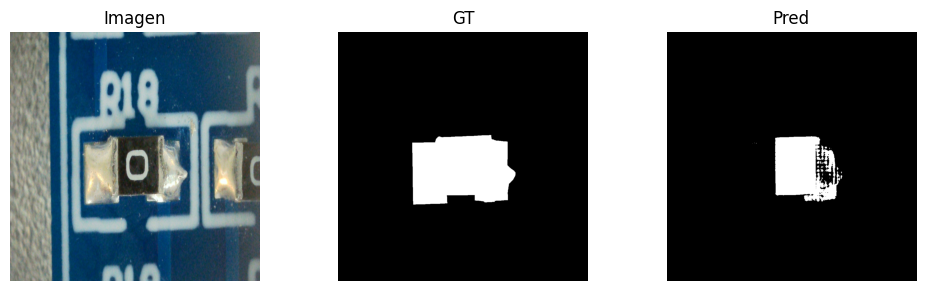

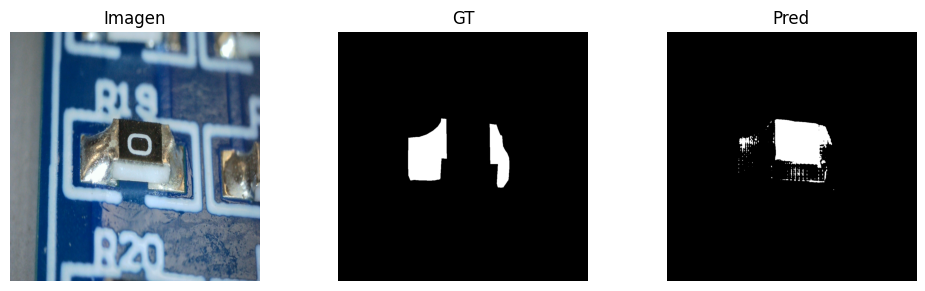

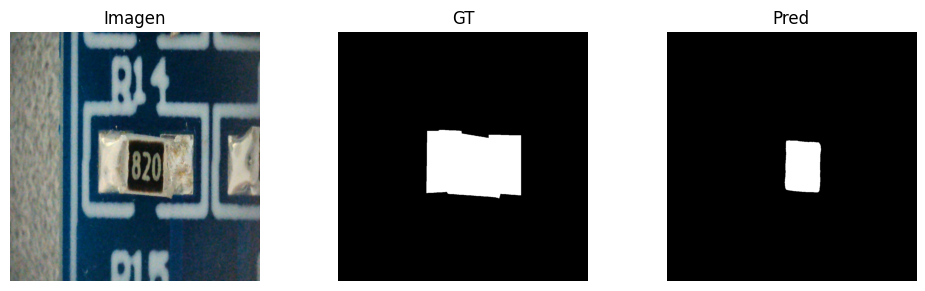

Resultados SIN FT: {'IoU': 0.15079724279497828, 'Dice': 0.226928551940126, 'Prec': 0.5809203359918198, 'Rec': 0.19872095011535015, 'Images': 86}
[DEBUG] IoU(manual vs predictor) = 0.9997
[DEBUG] IoU(manual vs predictor) = 0.9998
[DEBUG] IoU(manual vs predictor) = 1.0000
📈 Evaluando SAM con FT (decoder)...


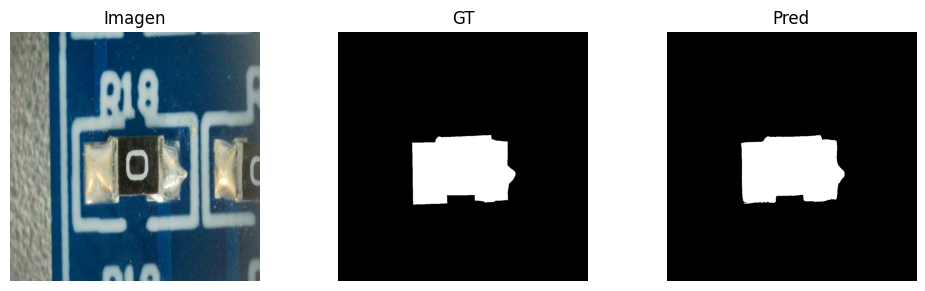

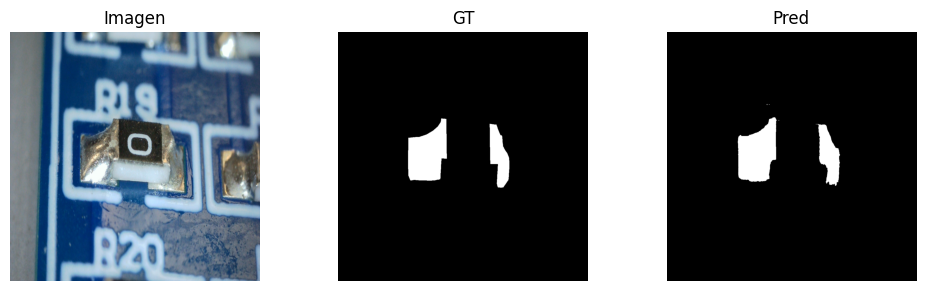

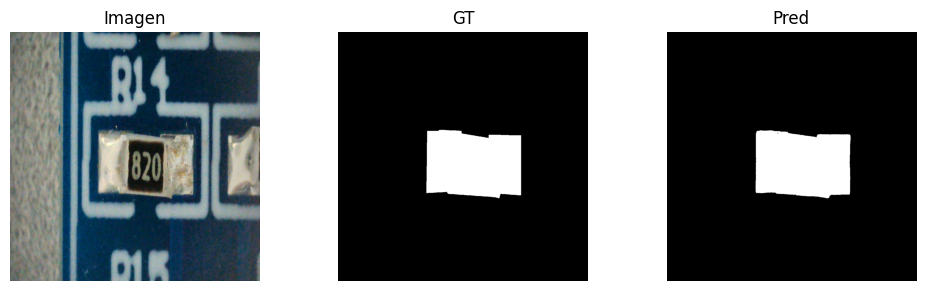

Resultados CON FT: {'IoU': 0.846291154477679, 'Dice': 0.9089990252288752, 'Prec': 0.9211911628525465, 'Rec': 0.9082631829752635, 'Images': 86}


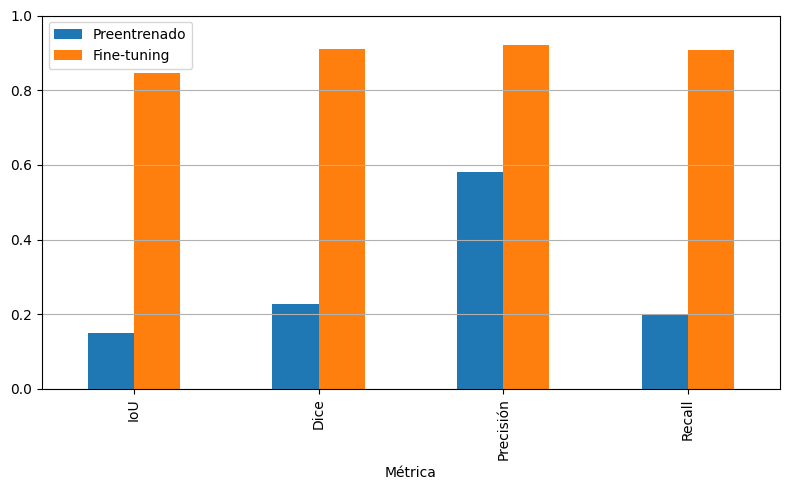

In [ ]:
import torch, numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from torch.nn.functional import interpolate, pad
from segment_anything import sam_model_registry, SamPredictor
from segment_anything.utils.transforms import ResizeLongestSide

# --- Constantes de SAM en espacio [0,1]
IMAGE_MEAN = torch.tensor([123.675, 116.28, 103.53]) / 255.0
IMAGE_STD  = torch.tensor([58.395, 57.12, 57.375]) / 255.0

# --- Helper: desnormaliza si detecta rango típico de ImageNet-normalized
def maybe_denorm_imagenet(images: torch.Tensor, device="cuda"):
    """
    Si detecta valores fuera de [0,1] (p.ej., [-2, +2]), asume Normalize(ImageNet) y desnormaliza.
    Devuelve tensores en [0,1].
    """
    mn, mx = float(images.min()), float(images.max())
    if mn < -0.05 or mx > 1.05:
        mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
        std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)
        return (images * std + mean).clamp(0,1)
    return images.clamp(0,1)

def evaluar_sam(
    sam_model, dataloader, device="cuda",
    thr=0.5, visualizar=False, max_visualizaciones=3
):
    """
    Evaluación manual con el MISMO preprocesado que SamPredictor:
    - ResizeLongestSide + normalización SAM + padding a 1024
    - Transform coords (x,y) desde original -> resized (sin pad)
    - Postprocess: 256->1024, recorte pad, resize a original
    Auto-desnormaliza si detecta ImageNet-Normalize en el loader.
    """
    sam_model.eval().to(device)
    img_size = sam_model.image_encoder.img_size  # 1024
    resize = ResizeLongestSide(img_size)

    tot_iou = tot_dice = tot_prec = tot_rec = 0.0
    n = 0
    shown = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images   = images.to(device, non_blocking=True)  # (B,3,H,W)
            masks_gt = masks_gt.to(device, non_blocking=True) # (B,1,H,W)

            # 1) Garantiza [0,1] (auto detecta si estaban normalizadas a ImageNet)
            images_rgb01 = maybe_denorm_imagenet(images, device=device)

            B, _, H0, W0 = images_rgb01.shape
            for b in range(B):
                img01 = images_rgb01[b].permute(1,2,0).detach().cpu().numpy()  # (H0,W0,3) [0,1]
                gt    = masks_gt[b]  # (1,H0,W0)
                orig_size = (H0, W0)

                # Centroide (y,x) en original
                coords = torch.nonzero(gt[0] > 0.5, as_tuple=False)
                if coords.numel() == 0:
                    continue
                cy, cx = coords.float().mean(dim=0)

                # 2) PREPRO SAM
                img_uint8 = (img01 * 255).astype(np.uint8)
                img_resized = resize.apply_image(img_uint8)         # H'×W'×3
                h, w = img_resized.shape[:2]
                inp = torch.as_tensor(img_resized, device=device).permute(2,0,1).float() / 255.0
                inp = (inp - IMAGE_MEAN.to(device)[:,None,None]) / IMAGE_STD.to(device)[:,None,None]
                padh = img_size - h
                padw = img_size - w
                inp = pad(inp, (0, padw, 0, padh))  # (C,1024,1024)
                inp = inp.unsqueeze(0)              # (1,3,1024,1024)

                # 3) Punto transformado (x,y) -> resized (sin pad)
                pts = np.array([[cx.item(), cy.item()]], dtype=np.float32)
                pts_rs = resize.apply_coords(pts, orig_size)   # (x',y')
                pts_t  = torch.as_tensor(pts_rs, device=device).unsqueeze(0)  # (1,1,2)
                lbl_t  = torch.tensor([[1]], dtype=torch.int64, device=device)

                # 4) Forward
                image_embedding = sam_model.image_encoder(inp)
                sp_emb, dn_emb = sam_model.prompt_encoder(points=(pts_t, lbl_t), boxes=None, masks=None)
                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sp_emb,
                    dense_prompt_embeddings=dn_emb,
                    multimask_output=False,
                )

                # 5) POSTPRO (igual a SamPredictor)
                masks = interpolate(low_res_logits, size=(img_size, img_size), mode="bilinear", align_corners=False)
                masks = masks[..., :h, :w]  # quitar pad (abajo/derecha)
                masks = interpolate(masks, size=orig_size, mode="bilinear", align_corners=False)  # (1,1,H0,W0)

                pred_bin = (torch.sigmoid(masks) > thr).float()
                gt_bin   = (gt.unsqueeze(0) > 0.5).float()

                inter = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0,1).sum().item()
                ps, gs = pred_bin.sum().item(), gt_bin.sum().item()

                iou  = inter / (union + 1e-7)
                dice = 2 * inter / (ps + gs + 1e-7)
                prec = inter / (ps + 1e-7)
                rec  = inter / (gs + 1e-7)

                tot_iou += iou; tot_dice += dice; tot_prec += prec; tot_rec += rec; n += 1

                if visualizar and shown < max_visualizaciones:
                    fig, ax = plt.subplots(1,3,figsize=(10,3))
                    ax[0].imshow(img01); ax[0].set_title("Imagen"); ax[0].axis("off")
                    ax[1].imshow(gt[0].detach().cpu(), cmap="gray"); ax[1].set_title("GT"); ax[1].axis("off")
                    ax[2].imshow(pred_bin[0,0].detach().cpu(), cmap="gray"); ax[2].set_title("Pred"); ax[2].axis("off")
                    plt.tight_layout(); plt.show()
                    shown += 1

    return {"IoU": tot_iou/max(1,n), "Dice": tot_dice/max(1,n), "Prec": tot_prec/max(1,n),
            "Rec": tot_rec/max(1,n), "Images": n}

# --- Debug: compara manual vs SamPredictor en 1-3 imágenes
def debug_comparar_manual_vs_predictor(sam_model, dataloader, device="cuda", thr=0.5, n_imgs=3):
    sam_model.eval().to(device)
    pred = SamPredictor(sam_model)
    img_size = sam_model.image_encoder.img_size
    resize = ResizeLongestSide(img_size)

    with torch.no_grad():
        cnt = 0
        for images, masks_gt in dataloader:
            images_rgb01 = maybe_denorm_imagenet(images.to(device))
            masks_gt = masks_gt.to(device)
            B,_,H,W = images_rgb01.shape
            for b in range(B):
                if cnt >= n_imgs: return
                gt = masks_gt[b]
                coords = torch.nonzero(gt[0] > 0.5, as_tuple=False)
                if coords.numel() == 0: continue
                cy, cx = coords.float().mean(dim=0)

                img01 = images_rgb01[b].permute(1,2,0).detach().cpu().numpy()
                img_uint8 = (img01*255).astype(np.uint8)

                # Predictor
                pred.set_image(img_uint8)
                pc = np.array([[cx.item(), cy.item()]], dtype=np.float32)
                pl = np.array([1], dtype=np.int32)
                m_pred,_,_ = pred.predict(point_coords=pc, point_labels=pl, multimask_output=False)
                mp = torch.from_numpy(m_pred[0]).to(device).float().unsqueeze(0).unsqueeze(0)

                # Manual (reusa pipeline de evaluar_sam)
                img_resized = resize.apply_image(img_uint8)
                h,w = img_resized.shape[:2]
                inp = torch.as_tensor(img_resized, device=device).permute(2,0,1).float()/255.0
                inp = (inp - IMAGE_MEAN.to(device)[:,None,None]) / IMAGE_STD.to(device)[:,None,None]
                padh, padw = img_size-h, img_size-w
                inp = pad(inp, (0,padw,0,padh)).unsqueeze(0)

                pts_rs = resize.apply_coords(pc, (H,W))
                pts_t  = torch.as_tensor(pts_rs, device=device).unsqueeze(0)
                lbl_t  = torch.tensor([[1]], dtype=torch.int64, device=device)

                emb = sam_model.image_encoder(inp)
                sp, dn = sam_model.prompt_encoder(points=(pts_t, lbl_t), boxes=None, masks=None)
                lrl,_ = sam_model.mask_decoder(
                    image_embeddings=emb,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sp,
                    dense_prompt_embeddings=dn,
                    multimask_output=False,
                )
                m = interpolate(lrl, size=(img_size, img_size), mode="bilinear", align_corners=False)
                m = m[..., :h, :w]
                m = interpolate(m, size=(H,W), mode="bilinear", align_corners=False)
                mm = (torch.sigmoid(m) > thr).float()

                # IoU entre manual y predictor (debería ~1.0)
                inter = (mm * mp).sum().item()
                union = (mm + mp).clamp(0,1).sum().item()
                iou_pp = inter / (union + 1e-7)
                print(f"[DEBUG] IoU(manual vs predictor) = {iou_pp:.4f}")
                cnt += 1

# =================== USO ====================
# 1) Evalúa PREENTRENADO con pipeline correcto
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"

sam_pre = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
print("📊 Evaluando SAM PREENTRENADO...")
res_pre = evaluar_sam(sam_pre, val_loader, device=device, thr=0.5, visualizar=True)
print("Resultados SIN FT:", res_pre)

# (Opcional) Debug de equivalencia manual vs predictor
debug_comparar_manual_vs_predictor(sam_pre, val_loader, device=device, thr=0.5, n_imgs=3)

# 2) Evalúa FINETUNED (carga solo el decoder ajustado)
finetuned_path = "/content/drive/MyDrive/TFG/checkpoints/sam_decoder_best_dice.pth"
sam_ft = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_ft.mask_decoder.load_state_dict(torch.load(finetuned_path, map_location=device))
print("📈 Evaluando SAM con FT (decoder)...")
res_ft = evaluar_sam(sam_ft, val_loader, device=device, thr=0.5, visualizar=True)
print("Resultados CON FT:", res_ft)

# 3) Comparativa rápida
df_compare = pd.DataFrame({
    "Métrica": ["IoU","Dice","Precisión","Recall"],
    "Preentrenado": [res_pre["IoU"], res_pre["Dice"], res_pre["Prec"], res_pre["Rec"]],
    "Fine-tuning":  [res_ft["IoU"],  res_ft["Dice"],  res_ft["Prec"],  res_ft["Rec"]],
}).set_index("Métrica")
ax = df_compare.plot(kind="bar", figsize=(8,5)); ax.set_ylim(0,1); ax.grid(axis="y"); plt.tight_layout(); plt.show()



📊 Evaluando SAM preentrenado...


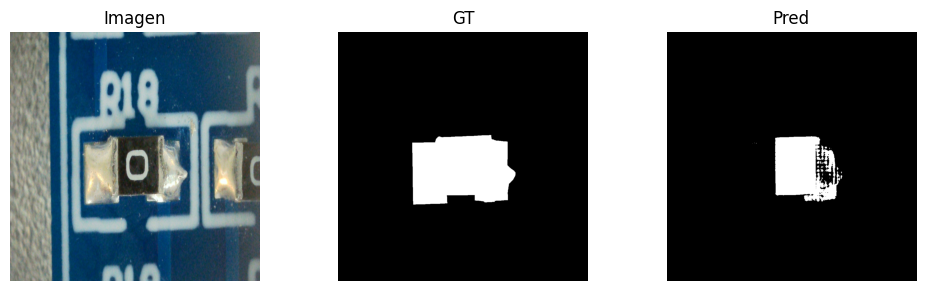

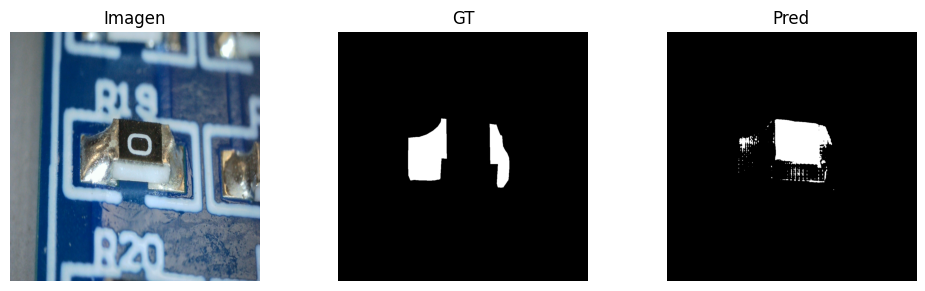

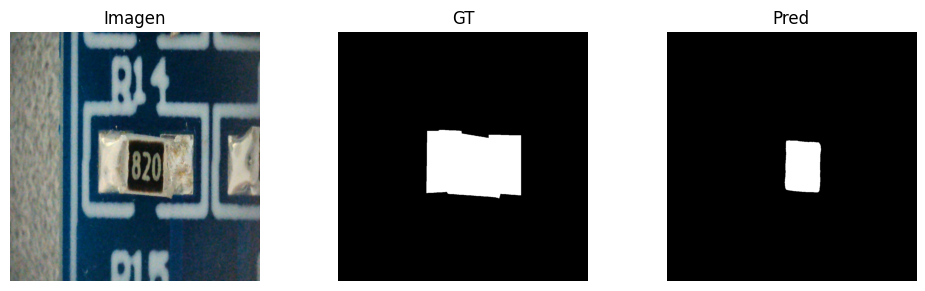

Resultados SIN fine-tuning: {'IoU': 0.15079724279497828, 'Dice': 0.226928551940126, 'Prec': 0.5809203359918198, 'Rec': 0.19872095011535015, 'Images': 86}
📈 Evaluando SAM con fine-tuning...


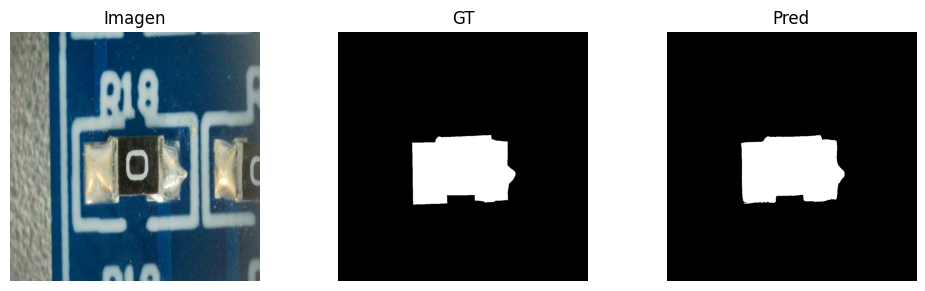

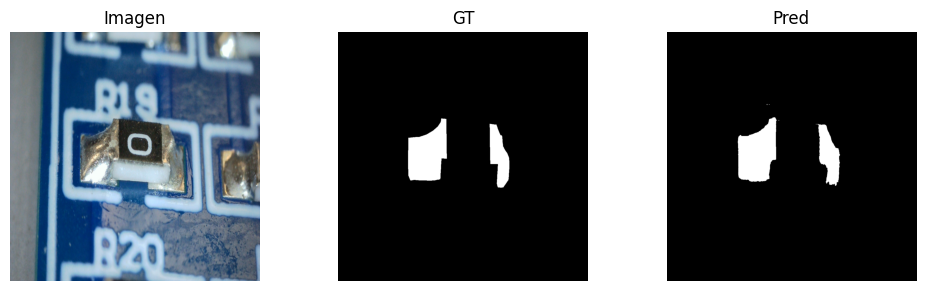

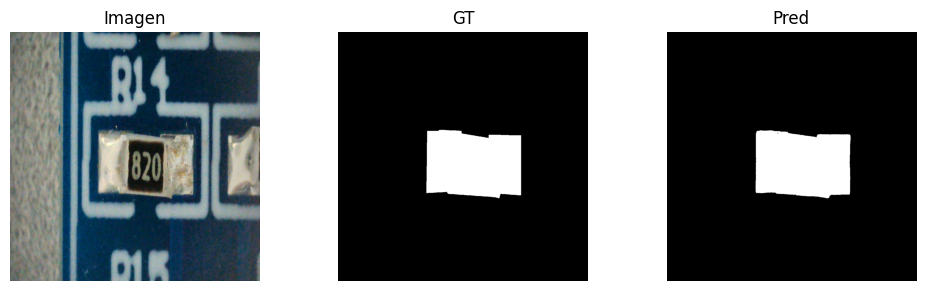

Resultados CON fine-tuning: {'IoU': 0.846291154477679, 'Dice': 0.9089990252288752, 'Prec': 0.9211911628525465, 'Rec': 0.9082631829752635, 'Images': 86}


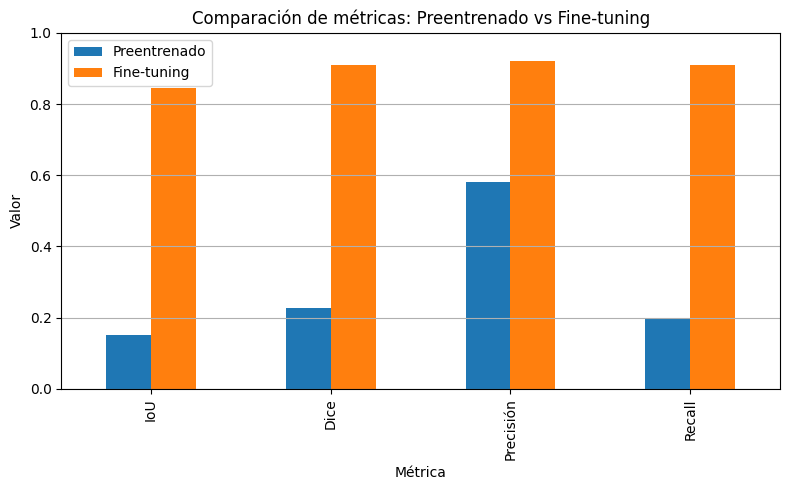

In [ ]:
import torch, numpy as np
import matplotlib.pyplot as plt
from torch.nn.functional import interpolate, pad
from segment_anything.utils.transforms import ResizeLongestSide

# Constantes oficiales de SAM (en espacio [0,1])
IMAGE_MEAN = torch.tensor([123.675, 116.28, 103.53]) / 255.0
IMAGE_STD  = torch.tensor([58.395, 57.12, 57.375]) / 255.0

def evaluar_sam(sam_model, dataloader, device="cuda",
                imagenet_norm=False, thr=0.5, visualizar=False, max_visualizaciones=3):
    """
    Evalúa SAM (sin FT o con decoder FT) usando forward manual:
    - ResizeLongestSide + padding a 1024
    - Normalización propia de SAM
    - Transformación correcta de coords del punto
    - Post-proceso para quitar padding y volver a tamaño original
    """
    sam_model.eval().to(device)
    resize = ResizeLongestSide(sam_model.image_encoder.img_size)  # 1024

    # Para desnormalizar si tu dataset viene con mean/std de ImageNet
    mean_imnet = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
    std_imnet  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)

    tot_iou = tot_dice = tot_prec = tot_rec = n = 0
    shown = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images   = images.to(device, non_blocking=True)
            masks_gt = masks_gt.to(device, non_blocking=True)

            # Desnormaliza si tu Dataset aplicó ImageNet normalize
            if imagenet_norm:
                images_rgb01 = (images * std_imnet + mean_imnet).clamp(0, 1)
            else:
                images_rgb01 = images.clamp(0, 1)

            B, _, H0, W0 = images.shape
            for b in range(B):
                img01 = images_rgb01[b].permute(1,2,0).detach().cpu().numpy()  # H×W×3 en [0,1]
                gt    = masks_gt[b]  # (1,H,W)

                # centroide (y, x) en tamaño original
                coords = torch.nonzero(gt[0] > 0.5, as_tuple=False)
                if coords.numel() == 0:
                    continue
                cy, cx = coords.float().mean(dim=0)
                orig_size = (H0, W0)

                # --- PREPRO de SAM: resize manteniendo aspecto
                img_resized = resize.apply_image((img01 * 255).astype(np.uint8))  # uint8
                h, w = img_resized.shape[:2]
                inp = torch.as_tensor(img_resized, device=device).permute(2,0,1).float() / 255.0
                # normalización SAM
                inp = (inp - IMAGE_MEAN[:,None,None].to(device)) / IMAGE_STD[:,None,None].to(device)
                # padding a 1024 (pad derecha y abajo)
                padh = sam_model.image_encoder.img_size - h
                padw = sam_model.image_encoder.img_size - w
                inp = pad(inp, (0, padw, 0, padh))  # (C,1024,1024)
                inp = inp.unsqueeze(0)

                # --- Transformar punto al espacio redimensionado
                pts = np.array([[cx.item(), cy.item()]], dtype=np.float32)  # (x,y) en original
                pts_rs = resize.apply_coords(pts, orig_size)                # (x',y') en resized (sin pad)
                pts_t  = torch.as_tensor(pts_rs, device=device).unsqueeze(0) # (1,1,2)
                lbl_t  = torch.tensor([[1]], dtype=torch.int64, device=device)

                # --- Forward
                image_embedding = sam_model.image_encoder(inp)
                sp_emb, dn_emb = sam_model.prompt_encoder(points=(pts_t, lbl_t), boxes=None, masks=None)
                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sp_emb,
                    dense_prompt_embeddings=dn_emb,
                    multimask_output=False,
                )

                # --- POSTPRO igual a SamPredictor: 256->1024, recorte de pad, resize a original
                masks = interpolate(low_res_logits, size=(sam_model.image_encoder.img_size,
                                                          sam_model.image_encoder.img_size),
                                    mode="bilinear", align_corners=False)          # (1,1,1024,1024)
                masks = masks[..., :h, :w]                                          # quitar pad
                masks = interpolate(masks, size=orig_size, mode="bilinear", align_corners=False)

                pred_bin = (torch.sigmoid(masks) > thr).float()          # (1,1,H,W)
                gt_bin   = (gt.unsqueeze(0) > 0.5).float()               # (1,1,H,W)

                inter = (pred_bin * gt_bin).sum().item()
                union = (pred_bin + gt_bin).clamp(0,1).sum().item()
                ps = pred_bin.sum().item()
                gs = gt_bin.sum().item()

                iou  = inter / (union + 1e-7)
                dice = 2 * inter / (ps + gs + 1e-7)
                prec = inter / (ps + 1e-7)
                rec  = inter / (gs + 1e-7)

                tot_iou += iou; tot_dice += dice; tot_prec += prec; tot_rec += rec; n += 1

                if visualizar and shown < max_visualizaciones:
                    import matplotlib.pyplot as plt
                    fig, ax = plt.subplots(1,3,figsize=(10,3))
                    ax[0].imshow(img01); ax[0].set_title("Imagen")
                    ax[1].imshow(gt[0].detach().cpu(), cmap="gray"); ax[1].set_title("GT")
                    ax[2].imshow(pred_bin[0,0].detach().cpu(), cmap="gray"); ax[2].set_title("Pred")
                    for a in ax: a.axis("off")
                    plt.tight_layout(); plt.show(); shown += 1

    return {
        "IoU":  tot_iou / max(1,n),
        "Dice": tot_dice / max(1,n),
        "Prec": tot_prec / max(1,n),
        "Rec":  tot_rec / max(1,n),
        "Images": n
    }


# === EVALUACIÓN PREENTRENADO ===
sam_pretrained = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
print("📊 Evaluando SAM preentrenado...")
result_pre = evaluar_sam(sam_pretrained, val_loader, device=device, visualizar=True)
print("Resultados SIN fine-tuning:", result_pre)

# 🔁 Liberar memoria
del sam_pretrained
torch.cuda.empty_cache()

# === EVALUACIÓN FINE-TUNED ===
sam_finetuned = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_finetuned.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
print("📈 Evaluando SAM con fine-tuning...")
result_fine = evaluar_sam(sam_finetuned, val_loader, device=device, visualizar=True)
print("Resultados CON fine-tuning:", result_fine)

# === 📊 Comparativa gráfica ===
df_compare = pd.DataFrame({
    "Métrica": ["IoU", "Dice", "Precisión", "Recall"],
    "Preentrenado": [result_pre["IoU"], result_pre["Dice"], result_pre["Prec"], result_pre["Rec"]],
    "Fine-tuning": [result_fine["IoU"], result_fine["Dice"], result_fine["Prec"], result_fine["Rec"]]
})

df_compare.set_index("Métrica").plot(kind="bar", figsize=(8, 5))
plt.title("Comparación de métricas: Preentrenado vs Fine-tuning")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()



📊 Resultados SIN fine-tuning: {'IoU': 0.24475567282727106, 'Dice': 0.32614314974328773, 'Prec': 0.2634251139327318, 'Rec': 0.4927572372598716, 'Images': 85}
📈 Resultados CON fine-tuning: {'IoU': 0.7279719221519411, 'Dice': 0.8229614948374473, 'Prec': 0.9300571018217957, 'Rec': 0.7737957894736422, 'Images': 85}


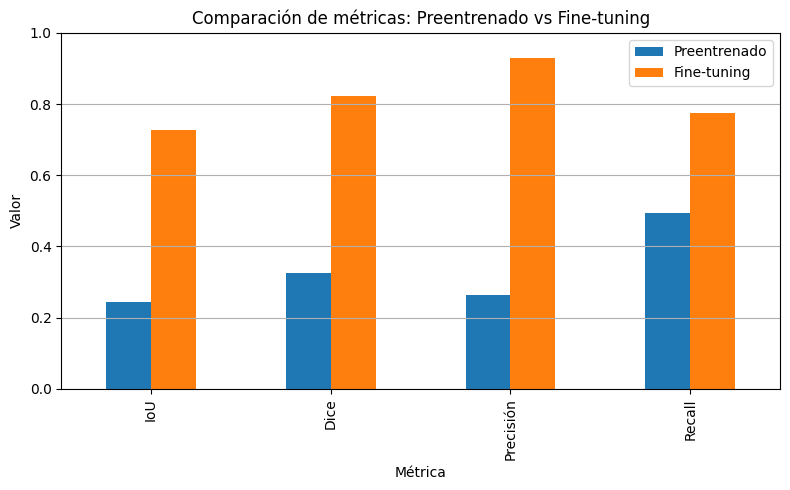

In [ ]:
import torch
import matplotlib.pyplot as plt
import pandas as pd
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide
import numpy as np
import time
import os

# === CONFIGURACIÓN ===
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"  # checkpoint preentrenado
fine_tuned_decoder_path = "sam_decoder_epoch17.pth"    # decoder fine-tuned
device = "cuda" if torch.cuda.is_available() else "cpu"

# === FUNCIÓN DE EVALUACIÓN ===
def evaluar_sam(sam_model, dataloader, device="cuda"):
    sam_model.eval()
    sam_model.to(device)

    total_iou = 0
    total_dice = 0
    total_precision = 0
    total_recall = 0
    total_imgs = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                coords = torch.nonzero(mask_gt[0] > 0.5)
                if len(coords) == 0:
                    continue

                point = coords.float().mean(dim=0)
                point_coords = torch.tensor([[point[1].item(), point[0].item()]], dtype=torch.float32)
                point_labels = torch.tensor([1], dtype=torch.int)

                # === Procesar imagen y redimensionar a 1024x1024 ===
                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)
                coords_torch = point_coords.unsqueeze(0).to(device)
                labels_torch = point_labels.unsqueeze(0).to(device)

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=(coords_torch, labels_torch),
                    boxes=None,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                # === Métricas
                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }


# === 1️⃣ Evaluación sin fine-tuning ===
sam_pretrained = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
result_pre = evaluar_sam(sam_pretrained, val_loader, device=device)
print("📊 Resultados SIN fine-tuning:", result_pre)

# === 2️⃣ Evaluación con fine-tuning ===
sam_finetuned = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_finetuned.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
result_fine = evaluar_sam(sam_finetuned, val_loader, device=device)
print("📈 Resultados CON fine-tuning:", result_fine)

# === 📊 Comparativa gráfica ===
df_compare = pd.DataFrame({
    "Métrica": ["IoU", "Dice", "Precisión", "Recall"],
    "Preentrenado": [result_pre["IoU"], result_pre["Dice"], result_pre["Prec"], result_pre["Rec"]],
    "Fine-tuning": [result_fine["IoU"], result_fine["Dice"], result_fine["Prec"], result_fine["Rec"]]
})

df_compare.set_index("Métrica").plot(kind="bar", figsize=(8, 5))
plt.title("Comparación de métricas: Preentrenado vs Fine-tuning")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.tight_layout()
plt.show()



🔎 Evaluando SAM preentrenado…


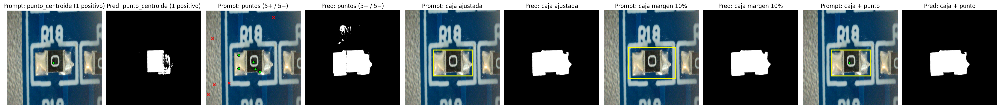

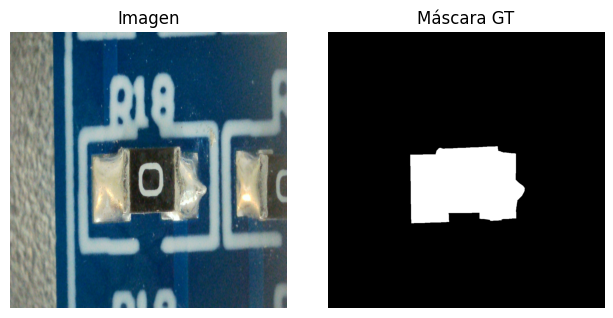

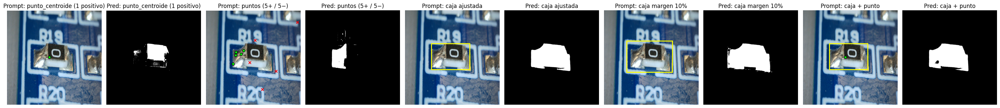

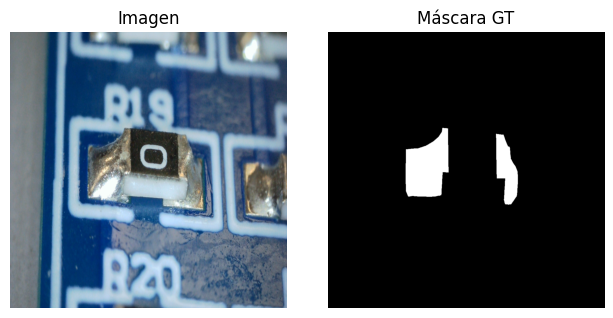

Resultados PRE (promedio por prompt):
                          Prompt       IoU      Dice      Prec       Rec   N
0                 caja ajustada  0.709791  0.802045  0.733278  0.955227  86
1                  caja + punto  0.700737  0.793336  0.729780  0.941321  86
2              puntos (5+ / 5−)  0.645199  0.762631  0.717390  0.902403  86
3               caja margen 10%  0.651718  0.755226  0.678335  0.933390  86
4  punto_centroide (1 positivo)  0.150796  0.226926  0.580918  0.198718  86
🚀 Evaluando SAM (decoder fine-tuned)…


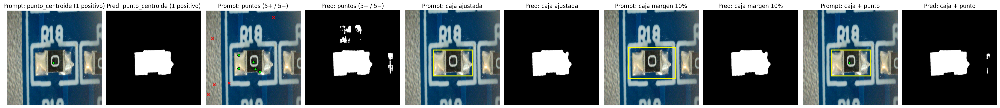

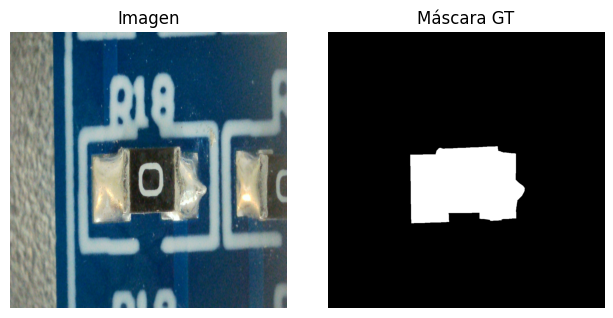

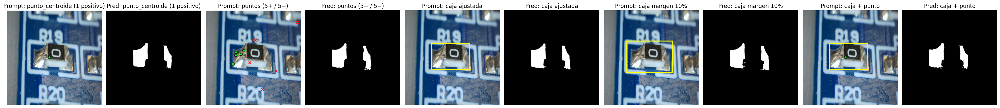

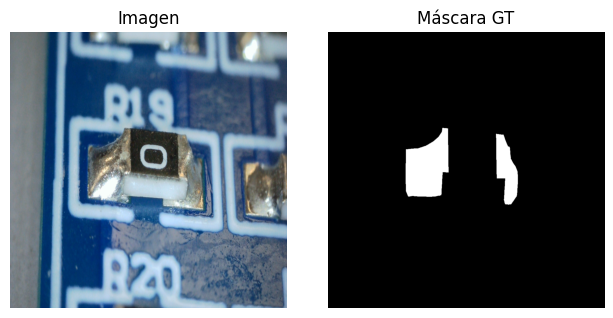

Resultados FT (promedio por prompt):
                          Prompt       IoU      Dice      Prec       Rec   N
0                 caja ajustada  0.845728  0.909606  0.889521  0.944126  86
1               caja margen 10%  0.845683  0.909335  0.887864  0.948383  86
2  punto_centroide (1 positivo)  0.846290  0.908998  0.921189  0.908264  86
3                  caja + punto  0.842758  0.908188  0.876377  0.954167  86
4              puntos (5+ / 5−)  0.840108  0.907301  0.879449  0.949493  86

Comparativa PRE vs FT por prompt:
                          Prompt   IoU_PRE    IoU_FT  Dice_PRE   Dice_FT  \
0                  caja + punto  0.700737  0.842758  0.793336  0.908188   
1                 caja ajustada  0.709791  0.845728  0.802045  0.909606   
2               caja margen 10%  0.651718  0.845683  0.755226  0.909335   
3  punto_centroide (1 positivo)  0.150796  0.846290  0.226926  0.908998   
4              puntos (5+ / 5−)  0.645199  0.840108  0.762631  0.907301   

   N_PRE  N_FT  
0 

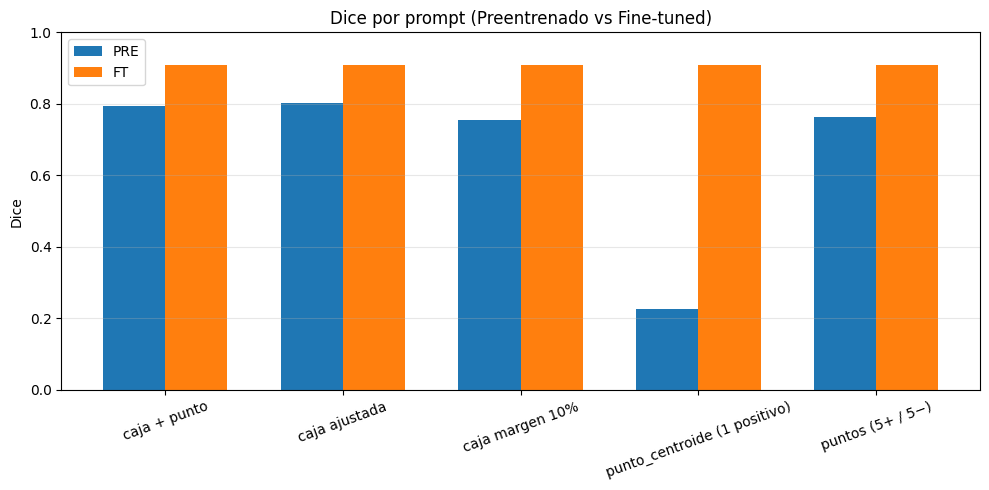

In [ ]:
# ======================= IMPORTS =======================
import numpy as np, torch, matplotlib.pyplot as plt, pandas as pd
from segment_anything import sam_model_registry, SamPredictor
import matplotlib.patches as patches

# ==================== HELPERS ====================
def maybe_denorm_imagenet(imgs: torch.Tensor, device="cuda"):
    """ Si detecta rango típico de imágenes normalizadas a ImageNet, desnormaliza a [0,1]. """
    mn, mx = float(imgs.min()), float(imgs.max())
    if mn < -0.05 or mx > 1.05:
        mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
        std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)
        return (imgs * std + mean).clamp(0,1)
    return imgs.clamp(0,1)

def compute_metrics(pred_bin: torch.Tensor, gt_bin: torch.Tensor):
    inter = (pred_bin * gt_bin).sum().item()
    union = (pred_bin + gt_bin).clamp(0,1).sum().item()
    ps, gs = pred_bin.sum().item(), gt_bin.sum().item()
    iou  = inter / (union + 1e-7)
    dice = 2 * inter / (ps + gs + 1e-7)
    prec = inter / (ps + 1e-7)
    rec  = inter / (gs + 1e-7)
    return iou, dice, prec, rec

def mask_bbox(gt_bin_np: np.ndarray, loose_factor: float = 0.0):
    """ Devuelve bbox (x_min, y_min, x_max, y_max) con margen opcional. """
    ys, xs = np.where(gt_bin_np > 0.5)
    if len(xs) == 0: return None
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()
    if loose_factor > 0:
        h, w = gt_bin_np.shape
        dx = int((x1 - x0 + 1) * loose_factor)
        dy = int((y1 - y0 + 1) * loose_factor)
        x0 = max(0, x0 - dx); y0 = max(0, y0 - dy)
        x1 = min(w-1, x1 + dx); y1 = min(h-1, y1 + dy)
    return np.array([[x0, y0, x1, y1]], dtype=np.float32)

def sample_points_posneg(gt_bin_np: np.ndarray, n_pos=5, n_neg=5, seed=123):
    rs = np.random.RandomState(seed)
    ys_pos, xs_pos = np.where(gt_bin_np > 0.5)
    ys_neg, xs_neg = np.where(gt_bin_np <= 0.5)
    if len(xs_pos) == 0: return None, None
    idx_pos = rs.choice(len(xs_pos), size=min(n_pos, len(xs_pos)), replace=False)
    pts_pos = np.stack([xs_pos[idx_pos], ys_pos[idx_pos]], axis=1)
    labels_pos = np.ones((pts_pos.shape[0],), dtype=np.int32)
    if len(xs_neg) > 0 and n_neg > 0:
        idx_neg = rs.choice(len(xs_neg), size=min(n_neg, len(xs_neg)), replace=False)
        pts_neg = np.stack([xs_neg[idx_neg], ys_neg[idx_neg]], axis=1)
        labels_neg = np.zeros((pts_neg.shape[0],), dtype=np.int32)
        pts = np.vstack([pts_pos, pts_neg]).astype(np.float32)
        labels = np.concatenate([labels_pos, labels_neg]).astype(np.int32)
    else:
        pts, labels = pts_pos.astype(np.float32), labels_pos
    return pts, labels

# ======= PROMPTS EN ESPAÑOL + VISUALIZACIÓN DEL PROMPT =======
def make_prompts_es(gt_bin_t: torch.Tensor):
    """
    Recibe GT tensor (1,H,W). Devuelve:
      dict(nombre_es -> dict(point_coords, point_labels, box))
    Nombres:
      - 'punto_centroide (1 positivo)'
      - 'puntos (5+ / 5−)'
      - 'caja ajustada'
      - 'caja margen 10%'
      - 'caja + punto'
    """
    gt_np = gt_bin_t[0].detach().cpu().numpy()
    prompts = {}

    # 1) Punto centroide
    ys, xs = np.where(gt_np > 0.5)
    if len(xs) > 0:
        cy, cx = ys.mean().astype(np.float32), xs.mean().astype(np.float32)
        prompts["punto_centroide (1 positivo)"] = {
            "point_coords": np.array([[cx, cy]], dtype=np.float32),
            "point_labels": np.array([1], dtype=np.int32),
            "box": None,
        }

    # 2) Puntos ± (5 y 5)
    pts, labels = sample_points_posneg(gt_np, n_pos=5, n_neg=5, seed=123)
    if pts is not None:
        prompts["puntos (5+ / 5−)"] = {
            "point_coords": pts.astype(np.float32),
            "point_labels": labels.astype(np.int32),
            "box": None,
        }

    # 3) Caja ajustada
    box_t = mask_bbox(gt_np, loose_factor=0.0)
    if box_t is not None:
        prompts["caja ajustada"] = {"point_coords": None, "point_labels": None, "box": box_t}

    # 4) Caja con 10% de margen
    box_l = mask_bbox(gt_np, loose_factor=0.10)
    if box_l is not None:
        prompts["caja margen 10%"] = {"point_coords": None, "point_labels": None, "box": box_l}

    # 5) Caja + punto
    if box_t is not None and "punto_centroide (1 positivo)" in prompts:
        prompts["caja + punto"] = {
            "point_coords": prompts["punto_centroide (1 positivo)"]["point_coords"],
            "point_labels": prompts["punto_centroide (1 positivo)"]["point_labels"],
            "box": box_t,
        }
    return prompts

def draw_prompt_on_ax(ax, img_np, prm, title=None):
    """ Dibuja el prompt sobre la imagen: puntos +/− y caja (si existe). """
    ax.imshow(img_np); ax.axis("off")
    if prm.get("box") is not None:
        (x0,y0,x1,y1) = prm["box"][0]
        rect = patches.Rectangle((x0,y0), x1-x0, y1-y0, linewidth=2, edgecolor='yellow', facecolor='none')
        ax.add_patch(rect)
    if prm.get("point_coords") is not None:
        pts = prm["point_coords"]; labels = prm["point_labels"]
        # positivos en verde, negativos en rojo
        if (labels == 1).any():
            pos = pts[labels==1]
            ax.scatter(pos[:,0], pos[:,1], s=30, marker='o', edgecolors='black', facecolors='lime', linewidths=1.0)
        if (labels == 0).any():
            neg = pts[labels==0]
            ax.scatter(neg[:,0], neg[:,1], s=30, marker='x', c='red', linewidths=1.5)
    if title: ax.set_title(title)

# =============== EVALUACIÓN CON PREDICTOR ===============
def eval_sam_with_prompts_es(sam_model, dataloader, device="cuda", thr=0.5,
                             visualizar=True, max_vis=3, seed=123):
    """
    Evalúa un SAM (preentrenado o FT) con varios prompts (en español).
    Muestra, para cada imagen visualizada, la **imagen con el prompt dibujado** y
    la **predicción** para ese prompt. Devuelve un DataFrame con métricas promedio por prompt.
    """
    torch.manual_seed(seed); np.random.seed(seed)
    sam_model.eval().to(device)
    predictor = SamPredictor(sam_model)

    acc = {}    # acumulador: nombre_es -> listas de métricas
    shown = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device, non_blocking=True)
            masks  = masks_gt.to(device, non_blocking=True)
            images_rgb01 = maybe_denorm_imagenet(images, device=device)

            B, _, H, W = images_rgb01.shape
            for b in range(B):
                gt = (masks[b] > 0.5).float()  # (1,H,W)
                if gt.sum() == 0: continue

                # preparar imagen para predictor (uint8 HWC)
                img_np = (images_rgb01[b].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)
                predictor.set_image(img_np)

                prompts = make_prompts_es(gt)
                preds_for_viz = []  # [(nombre, prompt, pred_bin_np)]

                for nombre_es, prm in prompts.items():
                    kwargs = {}
                    if prm["point_coords"] is not None:
                        kwargs["point_coords"] = prm["point_coords"]
                        kwargs["point_labels"] = prm["point_labels"]
                    if prm["box"] is not None:
                        kwargs["box"] = prm["box"]

                    masks_pred, _, _ = predictor.predict(multimask_output=False, **kwargs)
                    pred = torch.from_numpy(masks_pred[0]).to(device).float().unsqueeze(0).unsqueeze(0)
                    pred_bin = (pred > thr).float()
                    iou, dice, prec, rec = compute_metrics(pred_bin, gt.unsqueeze(0))

                    if nombre_es not in acc:
                        acc[nombre_es] = {"IoU":[], "Dice":[], "Prec":[], "Rec":[]}
                    acc[nombre_es]["IoU"].append(iou)
                    acc[nombre_es]["Dice"].append(dice)
                    acc[nombre_es]["Prec"].append(prec)
                    acc[nombre_es]["Rec"].append(rec)

                    # Para visualización: guardamos el prompt y la predicción binaria (np)
                    if visualizar and shown < max_vis:
                        preds_for_viz.append((nombre_es, prm, pred_bin[0,0].detach().cpu().numpy()))

                # ---- Visualización: para esta imagen, mostramos imagen con cada prompt + su predicción
                if visualizar and shown < max_vis and len(preds_for_viz) > 0:
                    cols = 2*len(preds_for_viz)
                    fig, axes = plt.subplots(1, cols, figsize=(3.0*cols, 3.2))
                    for j, (nombre_es, prm, m_pred) in enumerate(preds_for_viz):
                        ax_prompt = axes[2*j]
                        ax_pred   = axes[2*j + 1]
                        draw_prompt_on_ax(ax_prompt, img_np, prm, title=f"Prompt: {nombre_es}")
                        ax_pred.imshow(m_pred, cmap="gray"); ax_pred.axis("off"); ax_pred.set_title(f"Pred: {nombre_es}")
                    plt.tight_layout(); plt.show()
                    # Además, una figura aparte con Imagen y GT (una sola vez por imagen)
                    fig2, ax2 = plt.subplots(1,2, figsize=(6.5,3.2))
                    ax2[0].imshow(img_np); ax2[0].set_title("Imagen"); ax2[0].axis("off")
                    ax2[1].imshow(gt[0].detach().cpu(), cmap="gray"); ax2[1].set_title("Máscara GT"); ax2[1].axis("off")
                    plt.tight_layout(); plt.show()
                    shown += 1

    # promedios por prompt (en español)
    rows = []
    for nombre_es, d in acc.items():
        rows.append({
            "Prompt": nombre_es,
            "IoU":  float(np.mean(d["IoU"])) if d["IoU"] else 0.0,
            "Dice": float(np.mean(d["Dice"])) if d["Dice"] else 0.0,
            "Prec": float(np.mean(d["Prec"])) if d["Prec"] else 0.0,
            "Rec":  float(np.mean(d["Rec"])) if d["Rec"] else 0.0,
            "N":    len(d["IoU"])
        })
    df = pd.DataFrame(rows).sort_values("Dice", ascending=False).reset_index(drop=True)
    return df

# ================== CARGA Y COMPARATIVA =================
# Configura tus rutas
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"  # <-- ajusta ruta
fine_tuned_decoder_path = "/content/drive/MyDrive/TFG/checkpoints/sam_decoder_best_dice.pth"  # <-- ajusta ruta
device = "cuda" if torch.cuda.is_available() else "cpu"

# PREENTRENADO
sam_pre = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
print("🔎 Evaluando SAM preentrenado…")
df_pre = eval_sam_with_prompts_es(sam_pre, val_loader, device=device, thr=0.5, visualizar=True, max_vis=2)
print("Resultados PRE (promedio por prompt):\n", df_pre)

# FINETUNED (solo decoder ajustado)
del sam_pre; torch.cuda.empty_cache()
sam_ft = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_ft.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
print("🚀 Evaluando SAM (decoder fine-tuned)…")
df_ft = eval_sam_with_prompts_es(sam_ft, val_loader, device=device, thr=0.5, visualizar=True, max_vis=2)
print("Resultados FT (promedio por prompt):\n", df_ft)

# ======= GRÁFICA COMPARATIVA (nombres en español) =======
df_merge = pd.merge(df_pre, df_ft, on="Prompt", how="outer", suffixes=("_PRE","_FT"))
print("\nComparativa PRE vs FT por prompt:\n", df_merge[["Prompt","IoU_PRE","IoU_FT","Dice_PRE","Dice_FT","N_PRE","N_FT"]])

plt.figure(figsize=(10,5))
prompts = df_merge["Prompt"]
x = np.arange(len(prompts))
w = 0.35
plt.bar(x - w/2, df_merge["Dice_PRE"], width=w, label="PRE")
plt.bar(x + w/2, df_merge["Dice_FT"],  width=w, label="FT")
plt.xticks(x, prompts, rotation=20)
plt.ylim(0,1)
plt.ylabel("Dice")
plt.title("Dice por prompt (Preentrenado vs Fine-tuned)")
plt.grid(axis="y", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


🔎 Evaluando SAM preentrenado…


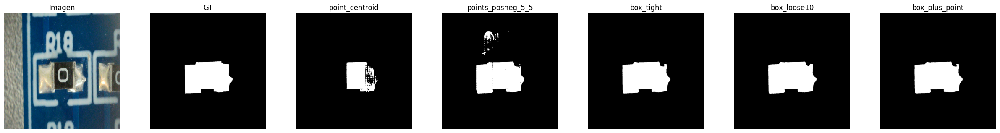

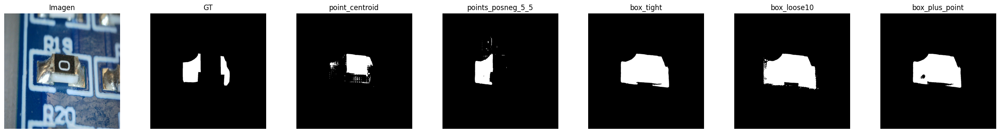

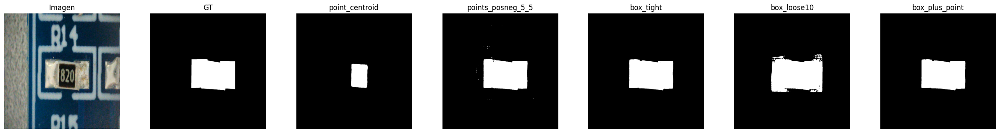

Resultados PRE:
               Prompt       IoU      Dice      Prec       Rec   N
0          box_tight  0.709791  0.802045  0.733278  0.955227  86
1     box_plus_point  0.700737  0.793336  0.729780  0.941321  86
2  points_posneg_5_5  0.645199  0.762631  0.717390  0.902403  86
3        box_loose10  0.651718  0.755226  0.678335  0.933390  86
4     point_centroid  0.150796  0.226926  0.580918  0.198718  86
🚀 Evaluando SAM (decoder fine-tuned)…


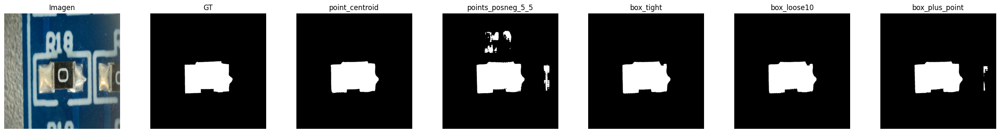

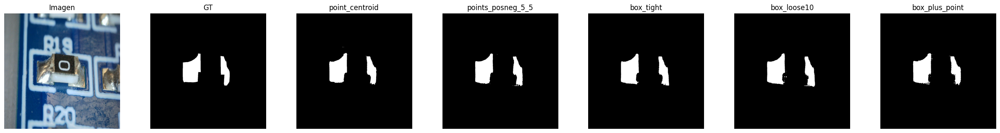

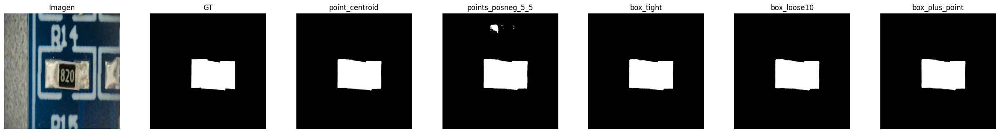

Resultados FT:
               Prompt       IoU      Dice      Prec       Rec   N
0          box_tight  0.845728  0.909606  0.889521  0.944126  86
1        box_loose10  0.845683  0.909335  0.887864  0.948383  86
2     point_centroid  0.846290  0.908998  0.921189  0.908264  86
3     box_plus_point  0.842758  0.908188  0.876377  0.954167  86
4  points_posneg_5_5  0.840108  0.907301  0.879449  0.949493  86

Comparativa PRE vs FT por prompt:
               Prompt   IoU_PRE    IoU_FT  Dice_PRE   Dice_FT  N_PRE  N_FT
0        box_loose10  0.651718  0.845683  0.755226  0.909335     86    86
1     box_plus_point  0.700737  0.842758  0.793336  0.908188     86    86
2          box_tight  0.709791  0.845728  0.802045  0.909606     86    86
3     point_centroid  0.150796  0.846290  0.226926  0.908998     86    86
4  points_posneg_5_5  0.645199  0.840108  0.762631  0.907301     86    86


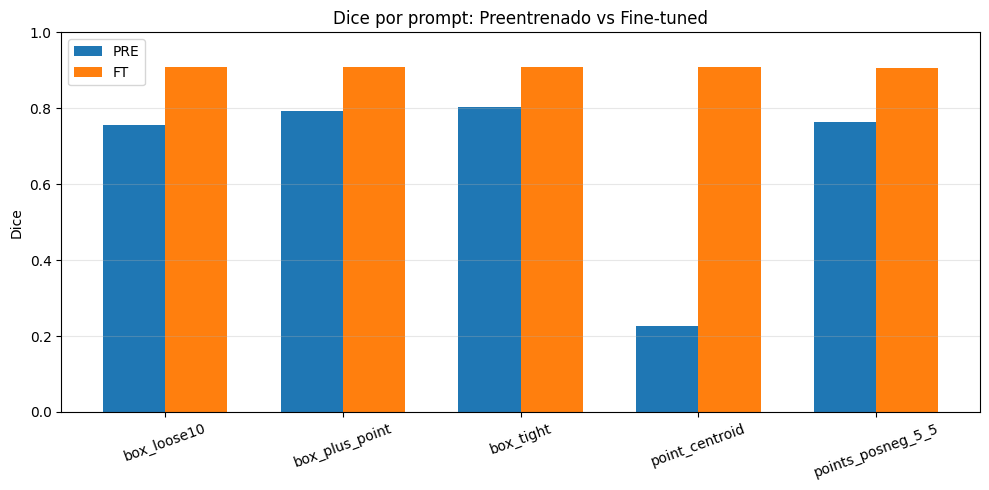

In [ ]:
# ======================= IMPORTS =======================
import os, numpy as np, torch, matplotlib.pyplot as plt, pandas as pd
from torch.utils.data import DataLoader
from segment_anything import sam_model_registry, SamPredictor

# ==================== HELPERS BÁSICOS ====================
def maybe_denorm_imagenet(imgs: torch.Tensor, device="cuda"):
    """
    Auto-detecta si las imágenes están normalizadas a ImageNet por rango.
    Devuelve en [0,1].
    """
    mn, mx = float(imgs.min()), float(imgs.max())
    if mn < -0.05 or mx > 1.05:
        mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(1,3,1,1)
        std  = torch.tensor([0.229, 0.224, 0.225], device=device).view(1,3,1,1)
        return (imgs * std + mean).clamp(0,1)
    return imgs.clamp(0,1)

def compute_metrics(pred_bin: torch.Tensor, gt_bin: torch.Tensor):
    inter = (pred_bin * gt_bin).sum().item()
    union = (pred_bin + gt_bin).clamp(0,1).sum().item()
    ps, gs = pred_bin.sum().item(), gt_bin.sum().item()
    iou  = inter / (union + 1e-7)
    dice = 2 * inter / (ps + gs + 1e-7)
    prec = inter / (ps + 1e-7)
    rec  = inter / (gs + 1e-7)
    return iou, dice, prec, rec

def mask_bbox(gt_bin_np: np.ndarray, loose_factor: float = 0.0):
    """ bbox de la máscara GT: (x_min, y_min, x_max, y_max) con margen opcional """
    ys, xs = np.where(gt_bin_np > 0.5)
    if len(xs) == 0: return None
    x0, x1 = xs.min(), xs.max()
    y0, y1 = ys.min(), ys.max()
    if loose_factor > 0:
        h, w = gt_bin_np.shape
        dx = int((x1 - x0 + 1) * loose_factor)
        dy = int((y1 - y0 + 1) * loose_factor)
        x0 = max(0, x0 - dx); y0 = max(0, y0 - dy)
        x1 = min(w-1, x1 + dx); y1 = min(h-1, y1 + dy)
    return np.array([[x0, y0, x1, y1]], dtype=np.float32)

def sample_points_posneg(gt_bin_np: np.ndarray, n_pos=5, n_neg=5, seed=123):
    rs = np.random.RandomState(seed)
    ys_pos, xs_pos = np.where(gt_bin_np > 0.5)
    ys_neg, xs_neg = np.where(gt_bin_np <= 0.5)
    if len(xs_pos) == 0: return None, None
    idx_pos = rs.choice(len(xs_pos), size=min(n_pos, len(xs_pos)), replace=False)
    pts_pos = np.stack([xs_pos[idx_pos], ys_pos[idx_pos]], axis=1)
    labels_pos = np.ones((pts_pos.shape[0],), dtype=np.int32)
    if len(xs_neg) > 0 and n_neg > 0:
        idx_neg = rs.choice(len(xs_neg), size=min(n_neg, len(xs_neg)), replace=False)
        pts_neg = np.stack([xs_neg[idx_neg], ys_neg[idx_neg]], axis=1)
        labels_neg = np.zeros((pts_neg.shape[0],), dtype=np.int32)
        pts = np.vstack([pts_pos, pts_neg]).astype(np.float32)
        labels = np.concatenate([labels_pos, labels_neg]).astype(np.int32)
    else:
        pts, labels = pts_pos.astype(np.float32), labels_pos
    return pts, labels

# =================== PROMPTS CONFIGS ===================
def make_prompts(gt_bin_t: torch.Tensor):
    """
    Recibe GT tensor (1,H,W). Devuelve dict {nombre: dict(point_coords, point_labels, box)}
    en coords de imagen original (pixeles). Usaremos SamPredictor para el resto.
    """
    gt_np = gt_bin_t[0].detach().cpu().numpy()
    prompts = {}

    # 1) Punto centroide (1 positivo)
    ys, xs = np.where(gt_np > 0.5)
    if len(xs) > 0:
        cy, cx = ys.mean().astype(np.float32), xs.mean().astype(np.float32)
        prompts["point_centroid"] = {
            "point_coords": np.array([[cx, cy]], dtype=np.float32),
            "point_labels": np.array([1], dtype=np.int32),
            "box": None,
        }

    # 2) Varios puntos +/−
    pts, labels = sample_points_posneg(gt_np, n_pos=5, n_neg=5, seed=123)
    if pts is not None:
        prompts["points_posneg_5_5"] = {
            "point_coords": pts.astype(np.float32),
            "point_labels": labels.astype(np.int32),
            "box": None,
        }

    # 3) Caja tight
    box_t = mask_bbox(gt_np, loose_factor=0.0)
    if box_t is not None:
        prompts["box_tight"] = {"point_coords": None, "point_labels": None, "box": box_t}

    # 4) Caja loose (10% margen)
    box_l = mask_bbox(gt_np, loose_factor=0.10)
    if box_l is not None:
        prompts["box_loose10"] = {"point_coords": None, "point_labels": None, "box": box_l}

    # 5) Caja + 1 punto (combinar)
    if box_t is not None and "point_centroid" in prompts:
        prompts["box_plus_point"] = {
            "point_coords": prompts["point_centroid"]["point_coords"],
            "point_labels": prompts["point_centroid"]["point_labels"],
            "box": box_t,
        }
    return prompts

# =============== EVALUACIÓN CON PREDICTOR ===============
def eval_sam_with_prompts(sam_model, dataloader, device="cuda", thr=0.5,
                          visualizar=True, max_vis=3, seed=123):
    """
    Evalúa un modelo SAM (pre o fine-tuned) con varios prompts.
    Devuelve un DataFrame con métricas promedio por prompt.
    """
    torch.manual_seed(seed); np.random.seed(seed)
    sam_model.eval().to(device)
    predictor = SamPredictor(sam_model)

    # Acumuladores: {prompt_name: [metrics...]}
    acc = {}  # prompt -> {"IoU":[], "Dice":[], "Prec":[], "Rec":[]}
    shown = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device, non_blocking=True)   # (B,3,H,W)
            masks  = masks_gt.to(device, non_blocking=True) # (B,1,H,W)
            images_rgb01 = maybe_denorm_imagenet(images, device=device)

            B, _, H, W = images_rgb01.shape
            for b in range(B):
                gt = (masks[b] > 0.5).float()  # (1,H,W)
                if gt.sum() == 0: continue

                # preparar imagen para predictor (uint8 HWC RGB)
                img_np = (images_rgb01[b].permute(1,2,0).detach().cpu().numpy() * 255).astype(np.uint8)
                predictor.set_image(img_np)

                # prompts para esta muestra
                prompts = make_prompts(gt)

                preds_for_viz = {}  # prompt -> bin mask np
                for name, prm in prompts.items():
                    kwargs = {}
                    if prm["point_coords"] is not None:
                        kwargs["point_coords"] = prm["point_coords"]
                        kwargs["point_labels"] = prm["point_labels"]
                    if prm["box"] is not None:
                        kwargs["box"] = prm["box"]

                    masks_pred, scores, logits = predictor.predict(
                        multimask_output=False, **kwargs
                    )
                    pred = torch.from_numpy(masks_pred[0]).to(device).float().unsqueeze(0).unsqueeze(0) # (1,1,H,W)
                    pred_bin = (pred > thr).float()
                    iou, dice, prec, rec = compute_metrics(pred_bin, gt.unsqueeze(0))

                    if name not in acc:
                        acc[name] = {"IoU":[], "Dice":[], "Prec":[], "Rec":[]}
                    acc[name]["IoU"].append(iou)
                    acc[name]["Dice"].append(dice)
                    acc[name]["Prec"].append(prec)
                    acc[name]["Rec"].append(rec)

                    if visualizar and shown < max_vis:
                        preds_for_viz[name] = pred_bin[0,0].detach().cpu().numpy()

                # visualización (una figura por imagen con todas las predicciones)
                if visualizar and shown < max_vis and len(preds_for_viz) > 0:
                    cols = 2 + len(preds_for_viz)
                    fig, axes = plt.subplots(1, cols, figsize=(3.5*cols, 3.2))
                    axes = axes.flatten()
                    axes[0].imshow(img_np); axes[0].set_title("Imagen"); axes[0].axis("off")
                    axes[1].imshow(gt[0].detach().cpu(), cmap="gray"); axes[1].set_title("GT"); axes[1].axis("off")
                    for j,(name, m) in enumerate(preds_for_viz.items(), start=2):
                        axes[j].imshow(m, cmap="gray")
                        axes[j].set_title(name)
                        axes[j].axis("off")
                    plt.tight_layout(); plt.show()
                    shown += 1

    # promedios por prompt
    rows = []
    for name, d in acc.items():
        rows.append({
            "Prompt": name,
            "IoU":  float(np.mean(d["IoU"])) if d["IoU"] else 0.0,
            "Dice": float(np.mean(d["Dice"])) if d["Dice"] else 0.0,
            "Prec": float(np.mean(d["Prec"])) if d["Prec"] else 0.0,
            "Rec":  float(np.mean(d["Rec"])) if d["Rec"] else 0.0,
            "N":    len(d["IoU"])
        })
    df = pd.DataFrame(rows).sort_values("Dice", ascending=False).reset_index(drop=True)
    return df

# ================ CARGA Y COMPARATIVA =================
# Config
sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
fine_tuned_decoder_path = "/content/drive/MyDrive/TFG/checkpoints/sam_decoder_best_dice.pth"
device = "cuda" if torch.cuda.is_available() else "cpu"

# PREENTRENADO
sam_pre = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
print("🔎 Evaluando SAM preentrenado…")
df_pre = eval_sam_with_prompts(sam_pre, val_loader, device=device, thr=0.5, visualizar=True, max_vis=3)
print("Resultados PRE:\n", df_pre)

# FINETUNED (carga solo decoder)
del sam_pre; torch.cuda.empty_cache()
sam_ft = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_ft.mask_decoder.load_state_dict(torch.load(fine_tuned_decoder_path, map_location=device))
print("🚀 Evaluando SAM (decoder fine-tuned)…")
df_ft = eval_sam_with_prompts(sam_ft, val_loader, device=device, thr=0.5, visualizar=True, max_vis=3)
print("Resultados FT:\n", df_ft)

# ================ GRÁFICA COMPARATIVA =================
# Unimos por prompt
df_merge = pd.merge(df_pre, df_ft, on="Prompt", how="outer", suffixes=("_PRE","_FT"))
print("\nComparativa PRE vs FT por prompt:\n", df_merge[["Prompt","IoU_PRE","IoU_FT","Dice_PRE","Dice_FT","N_PRE","N_FT"]])

# Barras por Dice
plt.figure(figsize=(10,5))
prompts = df_merge["Prompt"]
x = np.arange(len(prompts))
w = 0.35
plt.bar(x - w/2, df_merge["Dice_PRE"], width=w, label="PRE")
plt.bar(x + w/2, df_merge["Dice_FT"],  width=w, label="FT")
plt.xticks(x, prompts, rotation=20)
plt.ylim(0,1)
plt.ylabel("Dice")
plt.title("Dice por prompt: Preentrenado vs Fine-tuned")
plt.grid(axis="y", alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
def resumen_modelo(model, name="SAM"):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"📦 {name}: {trainable:,} / {total:,} parámetros entrenables")

# Verifica ambos modelos
resumen_modelo(sam_pretrained, "SAM Preentrenado")
resumen_modelo(sam_finetuned, "SAM Fine-tuned")


NameError: name 'sam_pretrained' is not defined

In [ ]:
def evaluar_sam(sam_model, dataloader, device="cuda", tipo_prompt="point", visualizar=False, max_visualizaciones=3):
    from matplotlib.patches import Rectangle

    sam_model.eval()
    sam_model.to(device)

    total_iou = total_dice = total_precision = total_recall = total_imgs = 0
    visualizados = 0

    with torch.no_grad():
        for images, masks_gt in dataloader:
            images = images.to(device)
            masks_gt = masks_gt.to(device)

            for b in range(images.size(0)):
                image_tensor = images[b]
                mask_gt = masks_gt[b]

                point_coords, point_labels, box = generar_prompts(mask_gt, tipo=tipo_prompt)
                if point_coords is not None:
                    point_coords_vis = point_coords.clone().cpu()
                    point_coords = point_coords.unsqueeze(0).to(device)
                    point_labels = point_labels.unsqueeze(0).to(device)
                else:
                    point_coords_vis = None
                    point_coords = point_labels = None

                if box is not None:
                    box_vis = box.clone().cpu()
                    box = box.to(device)
                else:
                    box_vis = None

                image_np = image_tensor.permute(1, 2, 0).cpu().numpy()
                image_np_resized = np.array(Image.fromarray((image_np * 255).astype(np.uint8)).resize((1024, 1024)))
                input_image_torch = torch.as_tensor(image_np_resized.transpose(2, 0, 1)).float().to(device) / 255.0
                input_image_torch = input_image_torch.unsqueeze(0)

                image_embedding = sam_model.image_encoder(input_image_torch)

                # ✅ Corrección aquí
                if point_coords is not None and point_labels is not None:
                    points = (point_coords, point_labels)
                else:
                    points = None

                sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
                    points=points,
                    boxes=box,
                    masks=None,
                )

                low_res_logits, _ = sam_model.mask_decoder(
                    image_embeddings=image_embedding,
                    image_pe=sam_model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False,
                )

                mask_pred = torch.sigmoid(low_res_logits)
                mask_pred_up = torch.nn.functional.interpolate(mask_pred, size=mask_gt.shape[-2:], mode="bilinear")
                mask_pred_bin = (mask_pred_up > 0.5).float()

                intersection = (mask_pred_bin * mask_gt).sum().item()
                union = ((mask_pred_bin + mask_gt).clamp(0, 1)).sum().item()
                pred_sum = mask_pred_bin.sum().item()
                gt_sum = mask_gt.sum().item()

                iou = intersection / (union + 1e-7)
                dice = 2 * intersection / (pred_sum + gt_sum + 1e-7)
                precision = intersection / (pred_sum + 1e-7)
                recall = intersection / (gt_sum + 1e-7)

                total_iou += iou
                total_dice += dice
                total_precision += precision
                total_recall += recall
                total_imgs += 1

                if visualizar and visualizados < max_visualizaciones:
                    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
                    axs[0].imshow(image_np)
                    axs[0].set_title("Imagen + Prompt")

                    if point_coords_vis is not None:
                        for x, y in point_coords_vis:
                            axs[0].scatter(x.item(), y.item(), color="lime", s=40)

                    if box_vis is not None:
                        x0, y0, x1, y1 = box_vis[0]
                        axs[0].add_patch(Rectangle((x0.item(), y0.item()), (x1 - x0).item(), (y1 - y0).item(),
                                                   edgecolor="red", facecolor="none", lw=2))

                    axs[1].imshow(mask_gt[0].cpu(), cmap="gray")
                    axs[1].set_title("Máscara GT")
                    axs[2].imshow(mask_pred_bin[0][0].cpu(), cmap="gray")
                    axs[2].set_title("Predicción")
                    for ax in axs:
                        ax.axis("off")
                    plt.tight_layout()
                    plt.show()
                    visualizados += 1

    return {
        "IoU": total_iou / total_imgs,
        "Dice": total_dice / total_imgs,
        "Prec": total_precision / total_imgs,
        "Rec": total_recall / total_imgs,
        "Images": total_imgs
    }


def evaluar_por_prompt(sam_model, dataloader, tipos_prompt=["point", "multi_point", "box", "box_point"], device="cuda", visualizar=False, max_visualizaciones=2):
    resultados = {}

    for tipo in tipos_prompt:
        print(f"\n📌 Evaluando con prompt: {tipo}")
        res = evaluar_sam(
            sam_model,
            dataloader,
            device=device,
            tipo_prompt=tipo,
            visualizar=visualizar,
            max_visualizaciones=max_visualizaciones
        )
        resultados[tipo] = res
        print(f"→ IoU:   {res['IoU']:.4f}")
        print(f"→ Dice:  {res['Dice']:.4f}")
        print(f"→ Prec:  {res['Prec']:.4f}")
        print(f"→ Rec:   {res['Rec']:.4f}")

    return resultados



In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("/content/drive/MyDrive/TFG/checkpoints/sam_decoder_best_dice.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="point", visualizar=True)


NameError: name 'generar_prompts' is not defined

In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="multi_point", visualizar=True)

FileNotFoundError: [Errno 2] No such file or directory: 'sam_decoder_epoch17.pth'

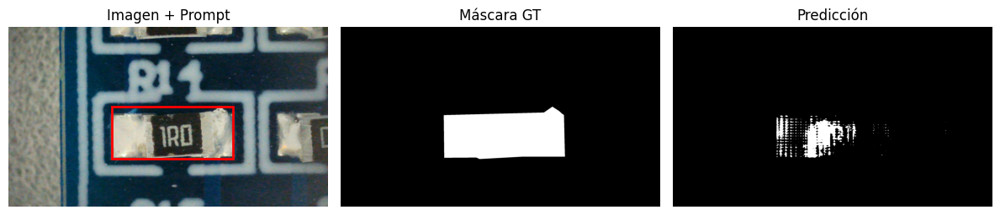

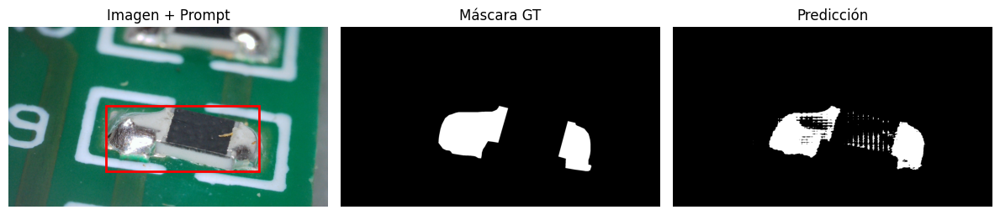

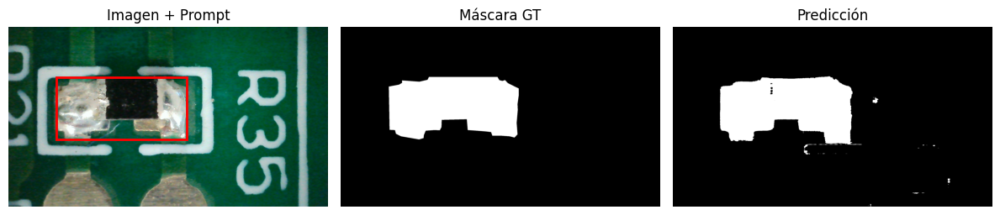

In [ ]:
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))
result_finetuned = evaluar_sam(sam, val_loader, device=device, tipo_prompt="box", visualizar=True)

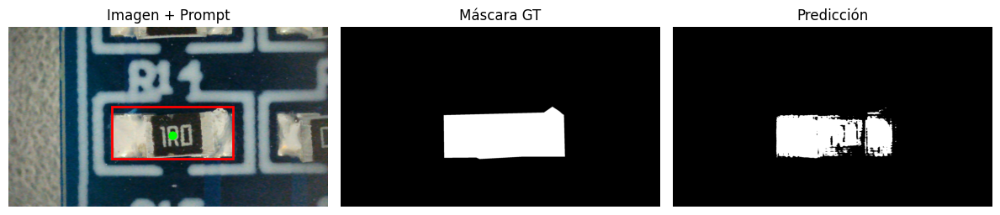

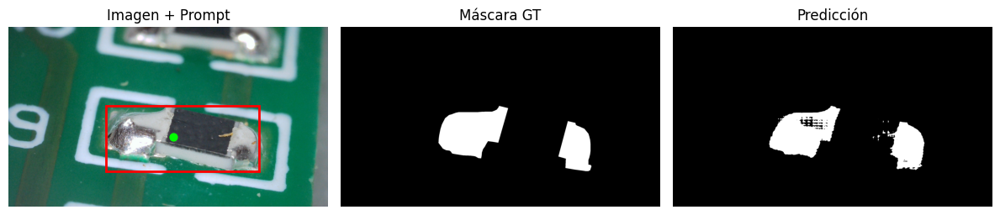

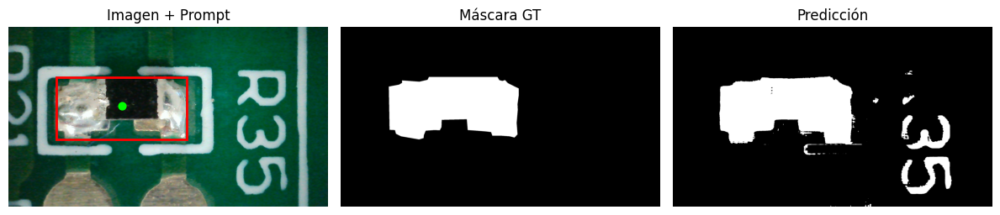

In [ ]:
from segment_anything import sam_model_registry

sam_type = "vit_b"
sam_ckpt_path = "/content/checkpoints/sam_vit_b.pth"
decoder_path = "sam_decoder_epoch17.pth"  # Usa tu ruta real

sam_model = sam_model_registry[sam_type](checkpoint=sam_ckpt_path).to(device)
sam_model.mask_decoder.load_state_dict(torch.load(decoder_path, map_location=device))

result = evaluar_sam(sam_model, val_loader, device=device, tipo_prompt="box_point", visualizar=True)


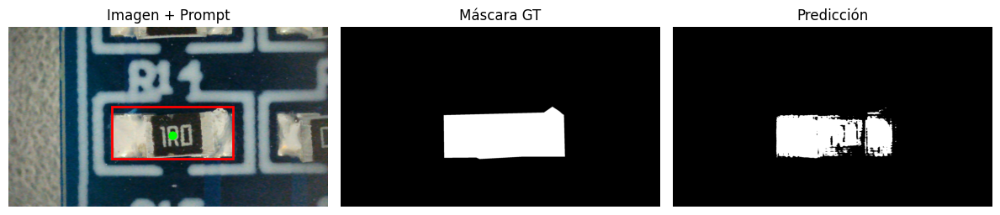

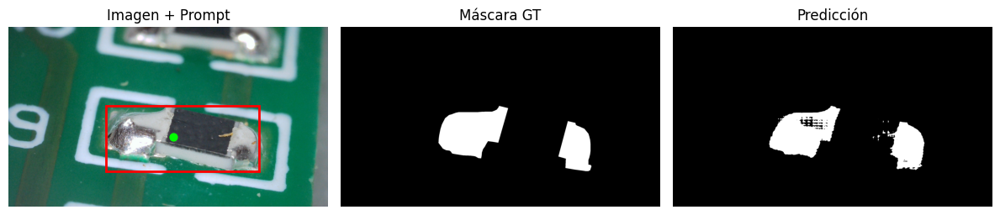

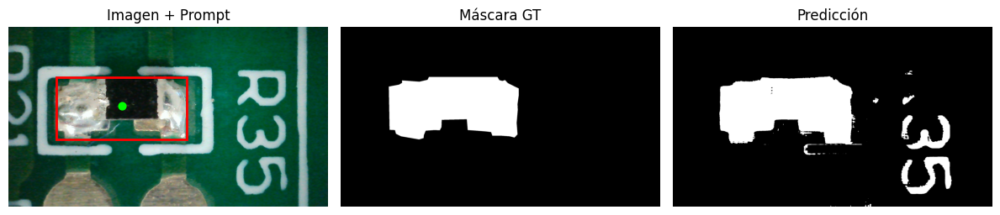

In [ ]:
result = evaluar_sam(sam_model, val_loader, device=device, tipo_prompt="box_point", visualizar=True)



📌 Evaluando con prompt: point


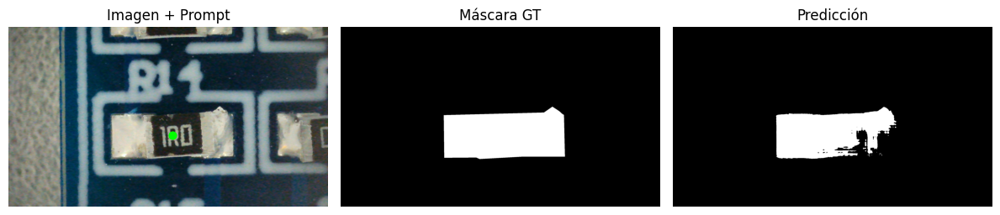

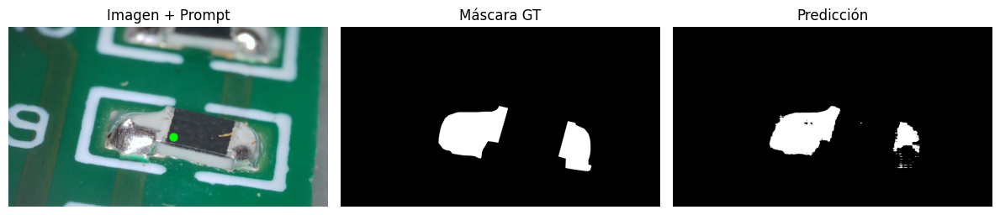

→ IoU:   0.8613
→ Dice:  0.9218
→ Prec:  0.9503
→ Rec:   0.9019

📌 Evaluando con prompt: multi_point


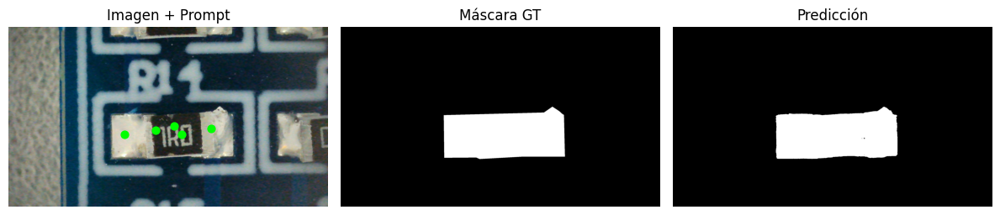

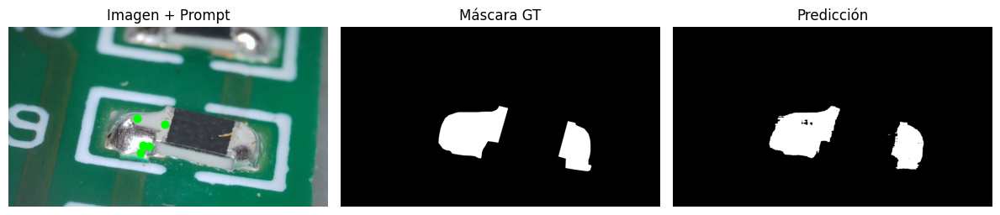

→ IoU:   0.8830
→ Dice:  0.9341
→ Prec:  0.9395
→ Rec:   0.9317

📌 Evaluando con prompt: box


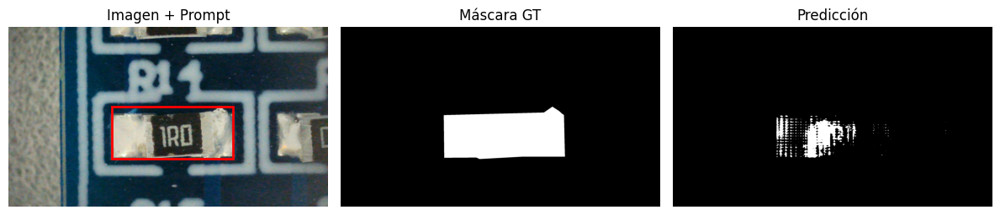

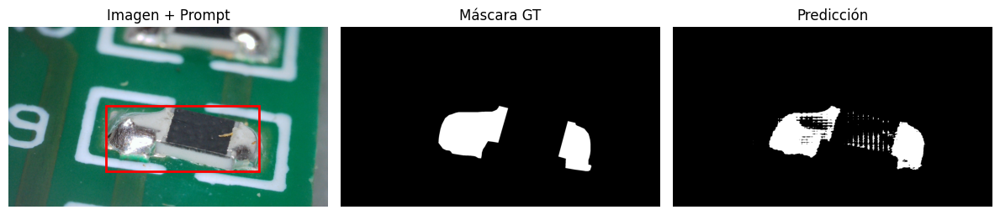

→ IoU:   0.7255
→ Dice:  0.8123
→ Prec:  0.8755
→ Rec:   0.8102

📌 Evaluando con prompt: box_point


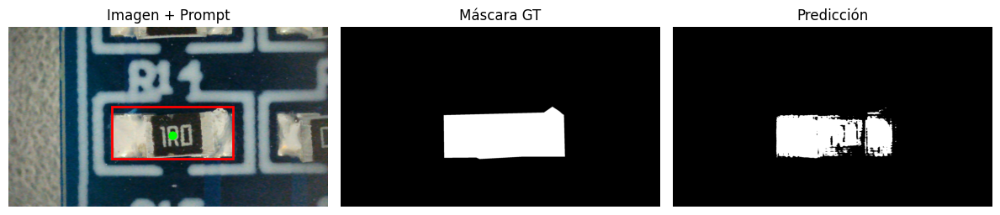

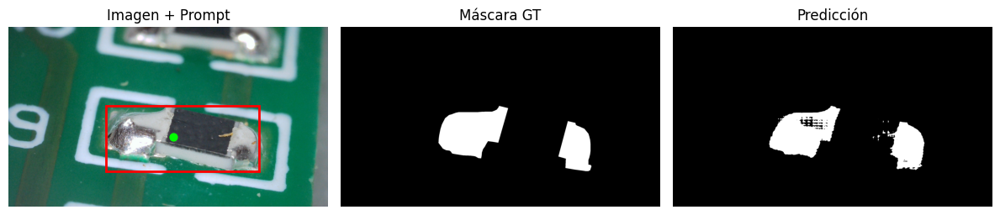

→ IoU:   0.8225
→ Dice:  0.8936
→ Prec:  0.8882
→ Rec:   0.9205

📊 Tabla comparativa de métricas:

                IoU    Dice    Prec     Rec
point        0.8613  0.9218  0.9503  0.9019
multi_point  0.8830  0.9341  0.9395  0.9317
box          0.7255  0.8123  0.8755  0.8102
box_point    0.8225  0.8936  0.8882  0.9205


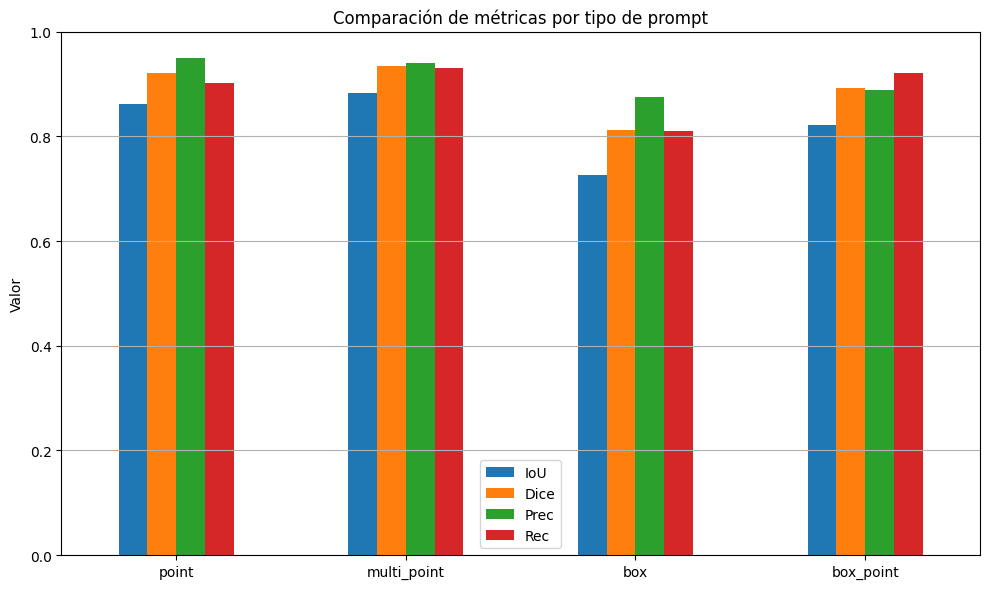

In [ ]:
# === Uso ===
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)
sam.mask_decoder.load_state_dict(torch.load("sam_decoder_epoch17.pth", map_location=device))

resultados_por_prompt = evaluar_por_prompt(sam, val_loader, device=device, visualizar=True)

# === Visualización gráfica ===
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(resultados_por_prompt).T[["IoU", "Dice", "Prec", "Rec"]]
print("\n📊 Tabla comparativa de métricas:\n")
print(df.round(4))

df.plot(kind="bar", figsize=(10, 6))
plt.title("Comparación de métricas por tipo de prompt")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


📌 Evaluando con prompt: point


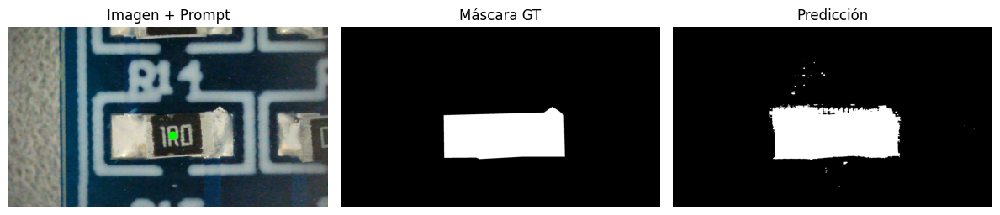

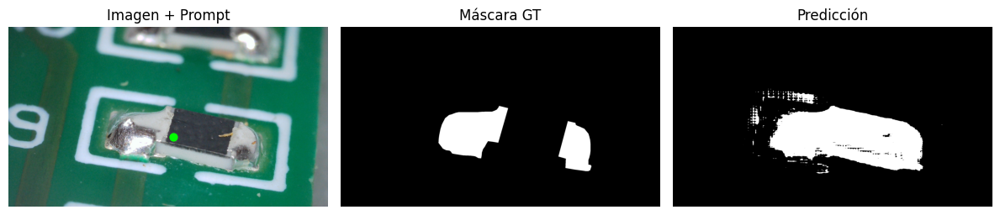

→ IoU:   0.2448
→ Dice:  0.3261
→ Prec:  0.2634
→ Rec:   0.4928

📌 Evaluando con prompt: multi_point


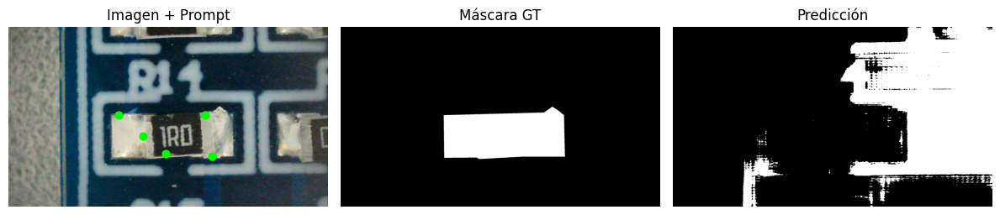

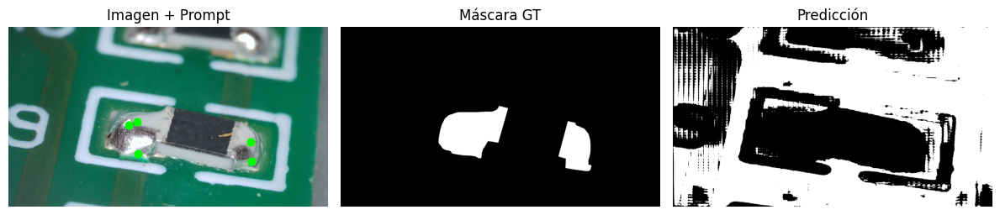

→ IoU:   0.0546
→ Dice:  0.0846
→ Prec:  0.0603
→ Rec:   0.2023

📌 Evaluando con prompt: box


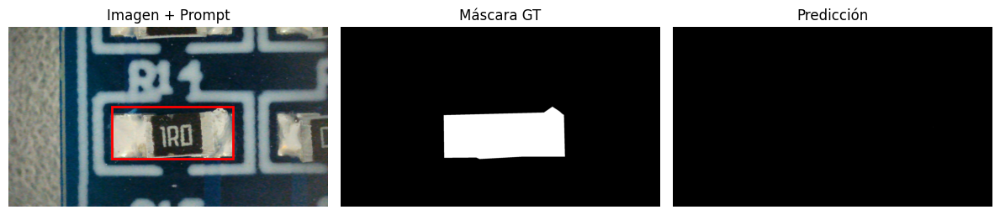

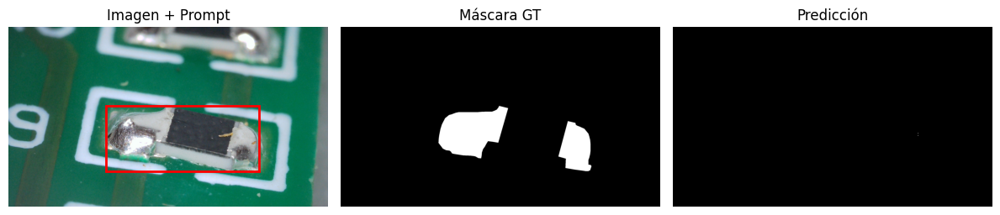

→ IoU:   0.0070
→ Dice:  0.0122
→ Prec:  0.2984
→ Rec:   0.0071

📌 Evaluando con prompt: box_point


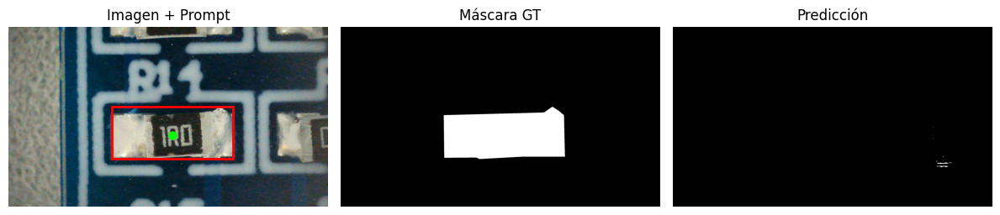

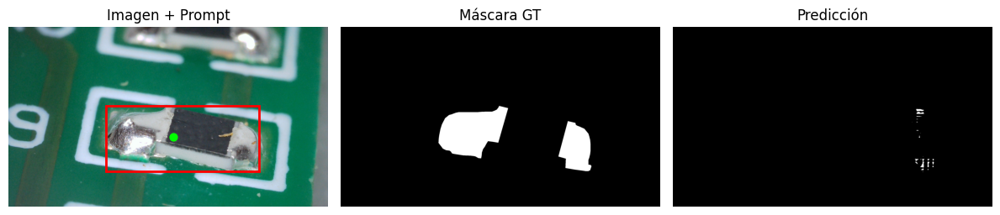

→ IoU:   0.0158
→ Dice:  0.0263
→ Prec:  0.1703
→ Rec:   0.0189

📊 Tabla comparativa de métricas (SAM sin fine-tuning):

                IoU    Dice    Prec     Rec
point        0.2448  0.3261  0.2634  0.4928
multi_point  0.0546  0.0846  0.0603  0.2023
box          0.0070  0.0122  0.2984  0.0071
box_point    0.0158  0.0263  0.1703  0.0189


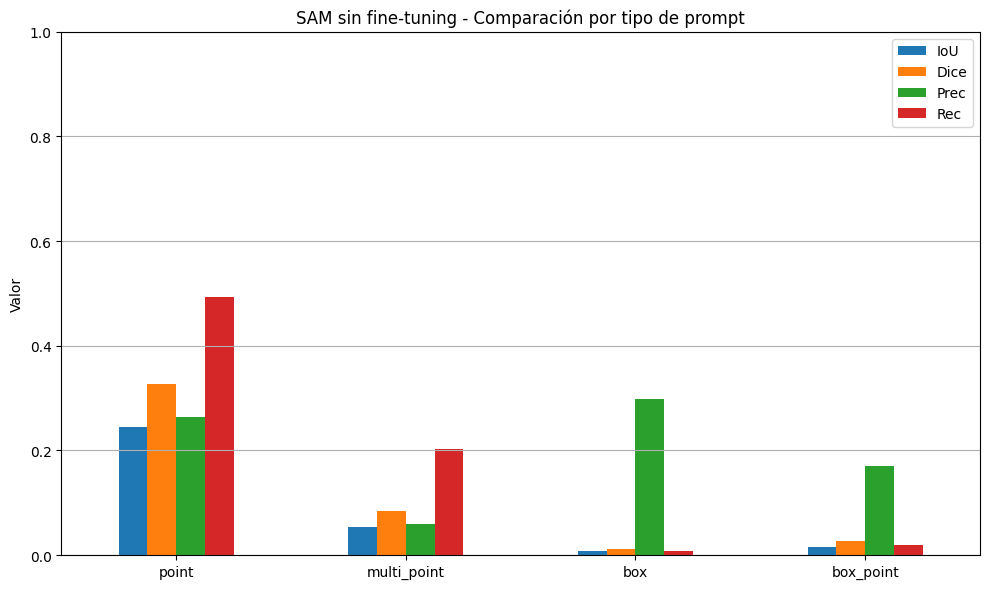

In [ ]:
# === Modelo preentrenado (SIN cargar decoder fine-tuned) ===
sam_pretrained = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path).to(device)

# === Evaluación con distintos tipos de prompt ===
resultados_por_prompt_pre = evaluar_por_prompt(sam_pretrained, val_loader, device=device, visualizar=True)

# === Visualización de métricas ===
import pandas as pd
import matplotlib.pyplot as plt

df_pre = pd.DataFrame(resultados_por_prompt_pre).T[["IoU", "Dice", "Prec", "Rec"]]
print("\n📊 Tabla comparativa de métricas (SAM sin fine-tuning):\n")
print(df_pre.round(4))

df_pre.plot(kind="bar", figsize=(10, 6))
plt.title("SAM sin fine-tuning - Comparación por tipo de prompt")
plt.ylabel("Valor")
plt.ylim(0, 1)
plt.grid(True, axis="y")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
